In [135]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.float_format', '{:.2f}'.format)
plt.rcParams['axes.formatter.useoffset'] = False
plt.rcParams['axes.formatter.use_mathtext'] = False
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
from sklearn.metrics import (
    mean_squared_error as mse,
    mean_absolute_error as mae,
    mean_absolute_percentage_error as mape
)

# Creating a function to print values of all these metrics.
def performance(actual, predicted):
    print('MAE :', round(mae(actual, predicted), 3))
    print('RMSE :', round(mse(actual, predicted)**0.5, 3))
    print('MAPE:', round(mape(actual, predicted), 3))
    
file_path = 'Exog_Campaign_eng.txt'
with open(file_path, 'r') as file:
    # Read the content of the file (assuming it is a single line of 0s and 1s)
    content = file.read().strip()  # Remove any leading/trailing whitespace

# Initialize an empty list to store valid binary digits
binary_list = []

# Iterate over each character in the string and convert to an integer if valid
for bit in content:
    if bit == '0' or bit == '1':  # Only process '0' or '1'
        binary_list.append(int(bit))

# Reading Data

In [4]:
df = pd.read_csv("train_1.csv")

In [5]:
df

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,18.00,11.00,5.00,13.00,14.00,9.00,9.00,22.00,26.00,...,32.00,63.00,15.00,26.00,14.00,20.00,22.00,19.00,18.00,20.00
1,2PM_zh.wikipedia.org_all-access_spider,11.00,14.00,15.00,18.00,11.00,13.00,22.00,11.00,10.00,...,17.00,42.00,28.00,15.00,9.00,30.00,52.00,45.00,26.00,20.00
2,3C_zh.wikipedia.org_all-access_spider,1.00,0.00,1.00,1.00,0.00,4.00,0.00,3.00,4.00,...,3.00,1.00,1.00,7.00,4.00,4.00,6.00,3.00,4.00,17.00
3,4minute_zh.wikipedia.org_all-access_spider,35.00,13.00,10.00,94.00,4.00,26.00,14.00,9.00,11.00,...,32.00,10.00,26.00,27.00,16.00,11.00,17.00,19.00,10.00,11.00
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,48.00,9.00,25.00,13.00,3.00,11.00,27.00,13.00,36.00,10.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145058,Underworld_(serie_de_películas)_es.wikipedia.o...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,13.00,12.00,13.00,3.00,5.00,10.00
145059,Resident_Evil:_Capítulo_Final_es.wikipedia.org...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
145060,Enamorándome_de_Ramón_es.wikipedia.org_all-acc...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
145061,Hasta_el_último_hombre_es.wikipedia.org_all-ac...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Check the Structure of the Dataset

In [6]:
# View the first few rows
display(df.head())

# Check the shape of the DataFrame
print("Shape:", df.shape)

# Get information about the DataFrame, including data types and non-null counts
display(df.info())

# Describe the numerical columns
display(df.describe())


,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,18.00,11.00,5.00,13.00,14.00,9.00,9.00,22.00,26.00,...,32.00,63.00,15.00,26.00,14.00,20.00,22.00,19.00,18.00,20.00
1,2PM_zh.wikipedia.org_all-access_spider,11.00,14.00,15.00,18.00,11.00,13.00,22.00,11.00,10.00,...,17.00,42.00,28.00,15.00,9.00,30.00,52.00,45.00,26.00,20.00
2,3C_zh.wikipedia.org_all-access_spider,1.00,0.00,1.00,1.00,0.00,4.00,0.00,3.00,4.00,...,3.00,1.00,1.00,7.00,4.00,4.00,6.00,3.00,4.00,17.00
3,4minute_zh.wikipedia.org_all-access_spider,35.00,13.00,10.00,94.00,4.00,26.00,14.00,9.00,11.00,...,32.00,10.00,26.00,27.00,16.00,11.00,17.00,19.00,10.00,11.00
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,48.00,9.00,25.00,13.00,3.00,11.00,27.00,13.00,36.00,10.00


Shape: (145063, 551)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145063 entries, 0 to 145062
Columns: 551 entries, Page to 2016-12-31
dtypes: float64(550), object(1)
memory usage: 609.8+ MB


None

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
count,124323.00,124247.00,124519.00,124409.00,124404.00,124580.00,124399.00,124769.00,124819.00,124721.00,...,141210.00,141479.00,141874.00,141319.00,141145.00,141362.00,141241.00,141237.00,141428.00,141598.00
mean,1195.86,1204.00,1133.68,1170.44,1217.77,1290.27,1239.14,1193.09,1197.99,1189.65,...,1394.10,1377.48,1393.10,1523.74,1679.61,1678.30,1633.97,1684.31,1467.94,1478.28
std,72753.52,74215.15,69610.22,72573.51,73796.12,80544.48,75762.88,68200.02,71497.17,72145.36,...,85748.80,77327.94,84785.33,87522.10,97945.34,92324.82,91858.31,90142.66,81554.81,88735.67
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,13.00,13.00,12.00,13.00,14.00,11.00,13.00,13.00,14.00,14.00,...,22.00,22.00,20.00,21.00,22.00,23.00,24.00,23.00,23.00,21.00
50%,109.00,108.00,105.00,105.00,113.00,113.00,115.00,117.00,115.00,113.00,...,149.00,143.00,132.00,145.00,160.00,162.00,163.00,160.00,154.00,136.00
75%,524.00,519.00,504.00,487.00,540.00,555.00,551.00,554.00,549.00,545.00,...,607.00,598.00,569.00,628.00,659.00,668.00,654.00,649.00,635.00,561.00
max,20381245.00,20752194.00,19573967.00,20439645.00,20772109.00,22544669.00,21210887.00,19107911.00,19993848.00,20201821.00,...,24201081.00,22539246.00,25056620.00,25865746.00,28342885.00,26916991.00,27025053.00,26073819.00,24363967.00,26149541.00


## Check for Missing Values

In [7]:
df

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,18.00,11.00,5.00,13.00,14.00,9.00,9.00,22.00,26.00,...,32.00,63.00,15.00,26.00,14.00,20.00,22.00,19.00,18.00,20.00
1,2PM_zh.wikipedia.org_all-access_spider,11.00,14.00,15.00,18.00,11.00,13.00,22.00,11.00,10.00,...,17.00,42.00,28.00,15.00,9.00,30.00,52.00,45.00,26.00,20.00
2,3C_zh.wikipedia.org_all-access_spider,1.00,0.00,1.00,1.00,0.00,4.00,0.00,3.00,4.00,...,3.00,1.00,1.00,7.00,4.00,4.00,6.00,3.00,4.00,17.00
3,4minute_zh.wikipedia.org_all-access_spider,35.00,13.00,10.00,94.00,4.00,26.00,14.00,9.00,11.00,...,32.00,10.00,26.00,27.00,16.00,11.00,17.00,19.00,10.00,11.00
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,48.00,9.00,25.00,13.00,3.00,11.00,27.00,13.00,36.00,10.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145058,Underworld_(serie_de_películas)_es.wikipedia.o...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,13.00,12.00,13.00,3.00,5.00,10.00
145059,Resident_Evil:_Capítulo_Final_es.wikipedia.org...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
145060,Enamorándome_de_Ramón_es.wikipedia.org_all-acc...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
145061,Hasta_el_último_hombre_es.wikipedia.org_all-ac...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### lots of missing values are present, for example date 2015-07-01 has 14% of missing values.

In [8]:
# Total missing values per column
display(df.isna().sum())

print("="*100)

# Percentage of missing values
display(df.isna().mean() * 100)


Page              0
2015-07-01    20740
2015-07-02    20816
2015-07-03    20544
2015-07-04    20654
              ...  
2016-12-27     3701
2016-12-28     3822
2016-12-29     3826
2016-12-30     3635
2016-12-31     3465
Length: 551, dtype: int64

Page          0.00
2015-07-01   14.30
2015-07-02   14.35
2015-07-03   14.16
2015-07-04   14.24
              ... 
2016-12-27    2.55
2016-12-28    2.63
2016-12-29    2.64
2016-12-30    2.51
2016-12-31    2.39
Length: 551, dtype: float64

# Lets split the Data into Title, Language, Access Type, Access Origin

In [9]:
df[['Title', 'Language', 'Access_Type', 'Access_Origin']] = df['Page'].str.extract(r'([^_]+(?:_[^_]+)*)_(\w+)\.wikipedia\.org_([^_]+)_(.+)')
df['Language'] = df['Language'].str.replace('_de', 'de', regex=False)

In [10]:
df.head(2)

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31,Title,Language,Access_Type,Access_Origin
0,2NE1_zh.wikipedia.org_all-access_spider,18.00,11.00,5.00,13.00,14.00,9.00,9.00,22.00,26.00,...,14.00,20.00,22.00,19.00,18.00,20.00,2NE1,zh,all-access,spider
1,2PM_zh.wikipedia.org_all-access_spider,11.00,14.00,15.00,18.00,11.00,13.00,22.00,11.00,10.00,...,9.00,30.00,52.00,45.00,26.00,20.00,2PM,zh,all-access,spider


# Lets see Distribution of Language,Access type and Access Origin

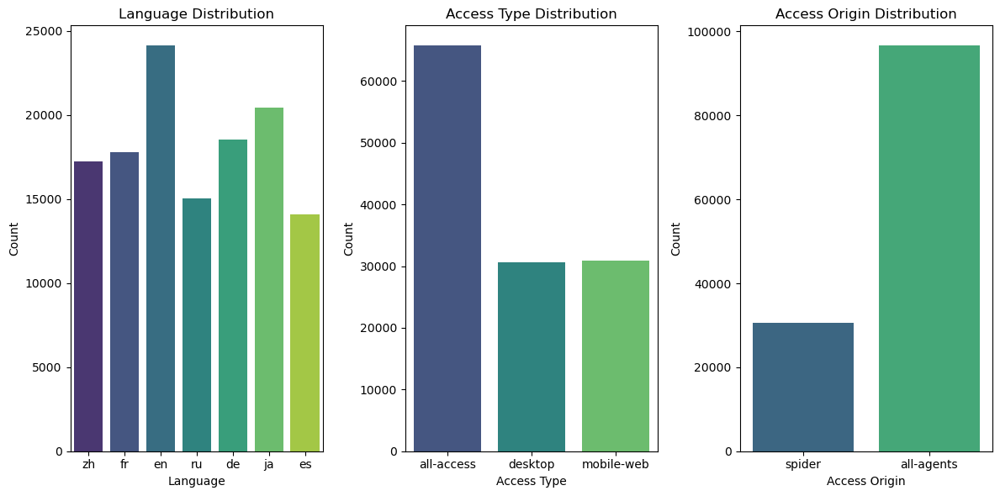

In [11]:
# Set up the visualizations
plt.figure(figsize=(12, 6))

# Count plot for Language
plt.subplot(1, 3, 1)
sns.countplot(data=df, x='Language', palette='viridis')
plt.title('Language Distribution')
plt.xlabel('Language')
plt.ylabel('Count')

# Count plot for Access Type
plt.subplot(1, 3, 2)
sns.countplot(data=df, x='Access_Type', palette='viridis')
plt.title('Access Type Distribution')
plt.xlabel('Access Type')
plt.ylabel('Count')

# Count plot for Access Origin
plt.subplot(1, 3, 3)
sns.countplot(data=df, x='Access_Origin', palette='viridis')
plt.title('Access Origin Distribution')
plt.xlabel('Access Origin')
plt.ylabel('Count')

# Show the plots
plt.tight_layout()
plt.show()

    - **Language**: The most common language appears to be 'en', followed by 'ja' and 'de'.
    - **Access Type**: The majority of visitors seem to access the website via 'all-access', followed by 'desktop'.
    - **Access Origin**: The 'all-agents' origin has a significantly higher count compared to 'spider'.

# Percentage share by each category

In [12]:
# Calculate counts and percentages for Language
language_counts = df['Language'].value_counts()
language_percentages = (language_counts / len(df)) * 100

# Display Language counts and percentages
print("Language Distribution:")
language_summary = pd.DataFrame({'Count': language_counts, 'Percentage': language_percentages})
display(language_summary)

# Calculate counts and percentages for Access Type
access_type_counts = df['Access_Type'].value_counts()
access_type_percentages = (access_type_counts / len(df)) * 100

# Display Access Type counts and percentages
print("\nAccess Type Distribution:")
access_type_summary = pd.DataFrame({'Count': access_type_counts, 'Percentage': access_type_percentages})
display(access_type_summary)

# Calculate counts and percentages for Access Origin
access_origin_counts = df['Access_Origin'].value_counts()
access_origin_percentages = (access_origin_counts / len(df)) * 100

# Display Access Origin counts and percentages
print("\nAccess Origin Distribution:")
access_origin_summary = pd.DataFrame({'Count': access_origin_counts, 'Percentage': access_origin_percentages})
display(access_origin_summary)

# Finding which language has the highest count for each Access Type and Access Origin
highest_language_access_type = df.groupby('Access_Type')['Language'].value_counts().idxmax()
highest_language_access_origin = df.groupby('Access_Origin')['Language'].value_counts().idxmax()

print(f"\nLanguage with highest count for Access Type: {highest_language_access_type}")
print(f"Language with highest count for Access Origin: {highest_language_access_origin}")

Language Distribution:


,Count,Percentage
Language,,
en,24108,16.62
ja,20431,14.08
de,18547,12.79
fr,17802,12.27
zh,17229,11.88
ru,15022,10.36
es,14069,9.70



Access Type Distribution:


,Count,Percentage
Access_Type,,
all-access,65713,45.30
mobile-web,30923,21.32
desktop,30572,21.07



Access Origin Distribution:


,Count,Percentage
Access_Origin,,
all-agents,96594,66.59
spider,30614,21.10



Language with highest count for Access Type: ('all-access', 'en')
Language with highest count for Access Origin: ('all-agents', 'en')


    - English (en) is the most frequently used language, accounting for 16.62% of visits, followed by Japanese (ja) at 14.08%.
    - "All-access" is the dominant access type, comprising 45.30% of visits, while "all-agents" is the primary access origin at 66.59%.

# Nans present in language

In [13]:
df["Language"].isna().sum()

17855

# Melting dates from columns to rows

In [14]:
df.drop(["Page"],inplace=True,axis=1)
df = df.melt(id_vars = ["Title","Language","Access_Type","Access_Origin"],var_name = "Date",value_name = "value")
# Convert 'Date' to datetime format
df['Date'] = pd.to_datetime(df['Date'])

In [15]:
df

,Title,Language,Access_Type,Access_Origin,Date,value
0,2NE1,zh,all-access,spider,2015-07-01,18.00
1,2PM,zh,all-access,spider,2015-07-01,11.00
2,3C,zh,all-access,spider,2015-07-01,1.00
3,4minute,zh,all-access,spider,2015-07-01,35.00
4,52_Hz_I_Love_You,zh,all-access,spider,2015-07-01,NaN
...,...,...,...,...,...,...
79784645,Underworld_(serie_de_películas),es,all-access,spider,2016-12-31,10.00
79784646,Resident_Evil:_Capítulo_Final,es,all-access,spider,2016-12-31,NaN
79784647,Enamorándome_de_Ramón,es,all-access,spider,2016-12-31,NaN
79784648,Hasta_el_último_hombre,es,all-access,spider,2016-12-31,NaN


## 1. Monthly Language Page Visits

In [16]:
monthly_visits = df.groupby([pd.Grouper(key='Date', freq='Y'), 'Language'])['value'].sum().reset_index()
monthly_visits = monthly_visits.sort_values(by="value",ascending=False)
display("Monthly Language Page Visits:\n", monthly_visits)

'Monthly Language Page Visits:\n'

,Date,Language,value
8,2016-12-31,en,42371810890.00
1,2015-12-31,en,16376949433.00
9,2016-12-31,es,6533221609.00
11,2016-12-31,ja,6120207967.00
7,2016-12-31,de,6082295607.00
12,2016-12-31,ru,5732729322.00
10,2016-12-31,fr,4516430763.00
2,2015-12-31,es,2956978890.00
0,2015-12-31,de,2779718144.00
4,2015-12-31,ja,2451082195.00


## 2. Top 10 Most Visited Titles for Each Language

In [17]:
top_titles = df.groupby(['Language', 'Title'])['value'].sum().reset_index()
top_titles = top_titles.sort_values(['Language', 'value'], ascending=[True, False])
top_10_titles = top_titles.groupby('Language').head(2)
display("Top 10 Most Visited Titles for Each Language:\n", top_10_titles)

'Top 10 Most Visited Titles for Each Language:\n'

,Language,Title,value
6632,de,Wikipedia:Hauptseite,3167931410.00
5784,de,Spezial:Suche,447324720.00
13089,en,Main_Page,24123683849.00
15904,en,Special:Search,2732400146.00
22458,es,Wikipedia:Portada,1513624439.00
19483,es,Especial:Buscar,389475393.00
28154,fr,Wikipédia:Accueil_principal,1783233299.00
27566,fr,Spécial:Recherche,193377423.00
30679,ja,メインページ,417501194.00
34011,ja,特別:検索,144174229.00


## 3. Total Visits Per Language

In [18]:
total_visits_per_language = df.groupby('Language')['value'].sum().reset_index()
display("Total Visits Per Language:\n", total_visits_per_language.sort_values(by="value",ascending=False))


'Total Visits Per Language:\n'

,Language,value
1,en,58748760323.00
2,es,9490200499.00
0,de,8862013751.00
4,ja,8571290162.00
5,ru,7998365818.00
3,fr,6377823517.00
6,zh,3171985333.00


## 4. Monthly Visits for Each Title

In [19]:
monthly_title_visits = df.groupby([pd.Grouper(key='Date', freq='M'), 'Title'])['value'].sum().reset_index()
display("Monthly Visits for Each Title:\n", monthly_title_visits.sort_values(by="value",ascending=False).head(10))


'Monthly Visits for Each Title:\n'

,Date,Title,value
564265,2016-08-31,Main_Page,2605366748.00
522053,2016-07-31,Main_Page,2149802461.00
606477,2016-09-30,Main_Page,1534588578.00
648689,2016-10-31,Main_Page,1479712381.00
733113,2016-12-31,Main_Page,1433643702.00
690901,2016-11-30,Main_Page,1376582791.00
15509,2015-07-31,Main_Page,1232202947.00
142145,2015-10-31,Main_Page,1192496140.00
57721,2015-08-31,Main_Page,1181599735.00
479841,2016-06-30,Main_Page,1160558315.00


## 5. Access Type Distribution

In [20]:
access_type_distribution = df.groupby('Access_Type')['value'].sum().reset_index()
display("Access Type Distribution:\n", access_type_distribution)
    

'Access Type Distribution:\n'

,Access_Type,value
0,all-access,52163341065.00
1,desktop,28007512625.00
2,mobile-web,23049585713.00


## 6. Access Origin Distribution

In [21]:
access_origin_distribution = df.groupby('Access_Origin')['value'].sum().reset_index()
display("Access Origin Distribution:\n", access_origin_distribution)


'Access Origin Distribution:\n'

,Access_Origin,value
0,all-agents,102014582369.00
1,spider,1205857034.00


## 7. Monthly Visits Breakdown by Language and Access Type

In [22]:
monthly_language_access = df.groupby([pd.Grouper(key='Date', freq='M'), 'Language', 'Access_Type'])['value'].sum().reset_index()
display("Monthly Visits Breakdown by Language and Access Type:\n", monthly_language_access)


'Monthly Visits Breakdown by Language and Access Type:\n'

,Date,Language,Access_Type,value
0,2015-07-31,de,all-access,216361288.00
1,2015-07-31,de,desktop,98034129.00
2,2015-07-31,de,mobile-web,110934589.00
3,2015-07-31,en,all-access,1338287302.00
4,2015-07-31,en,desktop,731008101.00
...,...,...,...,...
373,2016-12-31,ru,desktop,127346626.00
374,2016-12-31,ru,mobile-web,95405323.00
375,2016-12-31,zh,all-access,98812405.00
376,2016-12-31,zh,desktop,55684256.00


## 8. Top 5 Languages by Total Visits

In [23]:
top_languages = total_visits_per_language.sort_values(by='value', ascending=False).head(5)
display("Top 5 Languages by Total Visits:\n", top_languages)


'Top 5 Languages by Total Visits:\n'

,Language,value
1,en,58748760323.00
2,es,9490200499.00
0,de,8862013751.00
4,ja,8571290162.00
5,ru,7998365818.00


## 9. Trend Analysis of Visits Over Time

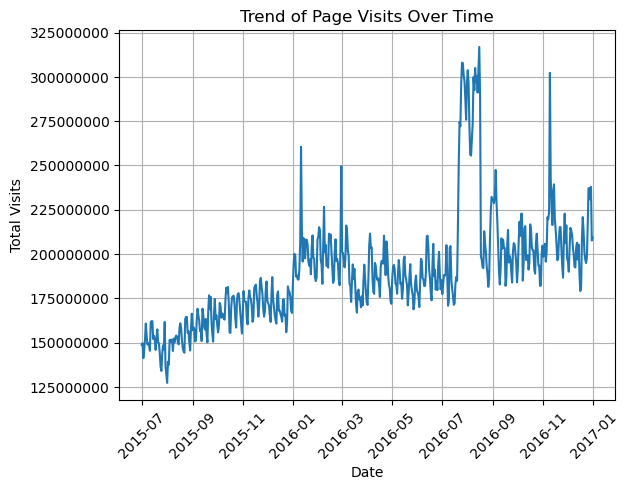

In [24]:
# You can visualize this using Matplotlib or Seaborn
import matplotlib.pyplot as plt

# Aggregate data for trend analysis
trend_data = df.groupby('Date')['value'].sum().reset_index()
plt.plot(trend_data['Date'], trend_data['value'])
plt.title('Trend of Page Visits Over Time')
plt.xlabel('Date')
plt.ylabel('Total Visits')
plt.xticks(rotation=45)
plt.grid()
plt.ticklabel_format(style='plain', axis='y')
plt.show()


There's sudden spike in 08-2016 

# seggregating different langauges

In [25]:
df['Date'] = pd.to_datetime(df['Date'])

# Extract the month and year from the Date
df['YearMonthDate'] = df['Date'].dt.to_period('D')

# Calculate monthly sums for each language
daily_sums = df.groupby(['YearMonthDate', 'Language'])['value'].sum().reset_index()

daily_sums = daily_sums[["YearMonthDate","value","Language"]]
daily_sums['YearMonthDate'] = daily_sums['YearMonthDate'].dt.to_timestamp()

# Create separate DataFrames for each language
language_dfs = {lang: daily_sums[daily_sums['Language'] == lang].reset_index(drop=True) 
                for lang in daily_sums['Language'].unique()}

In [26]:
language_dfs.keys()

dict_keys(['de', 'en', 'es', 'fr', 'ja', 'ru', 'zh'])

In [27]:
de,en,es,fr,ja,ru,zh = language_dfs["de"],language_dfs["en"],language_dfs["es"],language_dfs["fr"],language_dfs["ja"],language_dfs["ru"],language_dfs["zh"]

In [28]:
DE = de.copy()
EN = en.copy()
ES = es.copy()
FR = fr.copy()
JA = ja.copy()
RU = ru.copy()
ZH = zh.copy()

In [574]:
LANGDF = language_dfs.copy()

# Range of data (about 550 days of data)

In [93]:
df["YearMonthDate"].min()

Period('2015-07-01', 'D')

In [94]:
df["YearMonthDate"].max()

Period('2016-12-31', 'D')

# Monthly page view for all languages

for language:  de


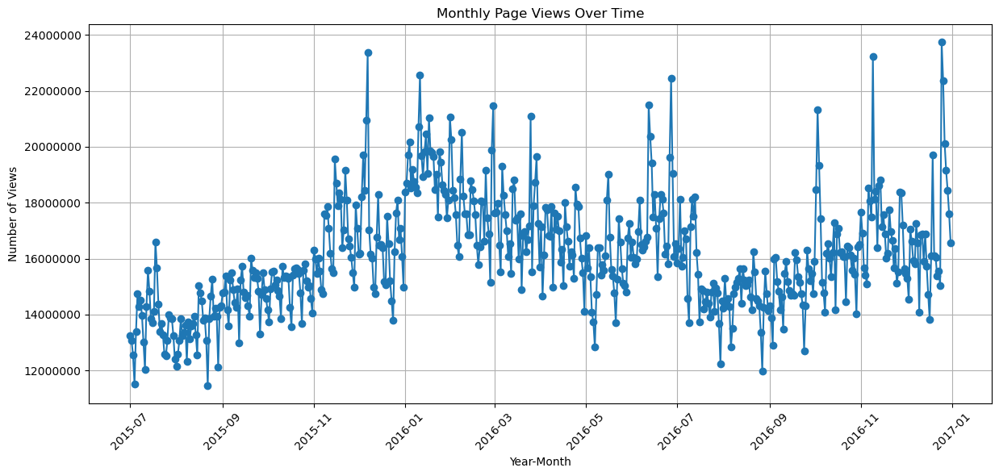

for language:  en


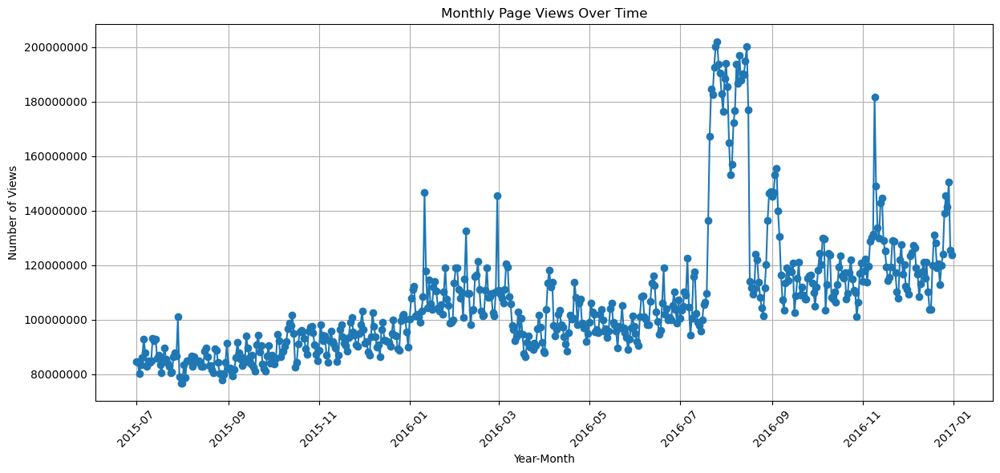

for language:  es


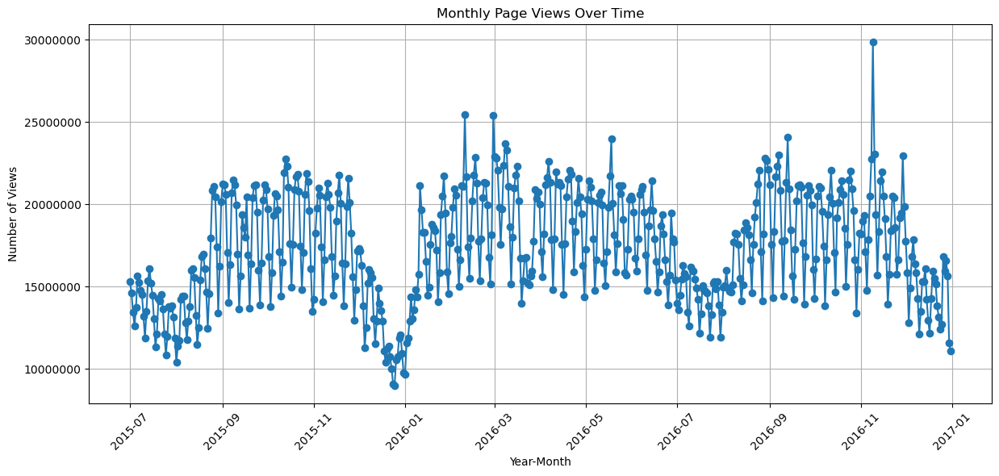

for language:  fr


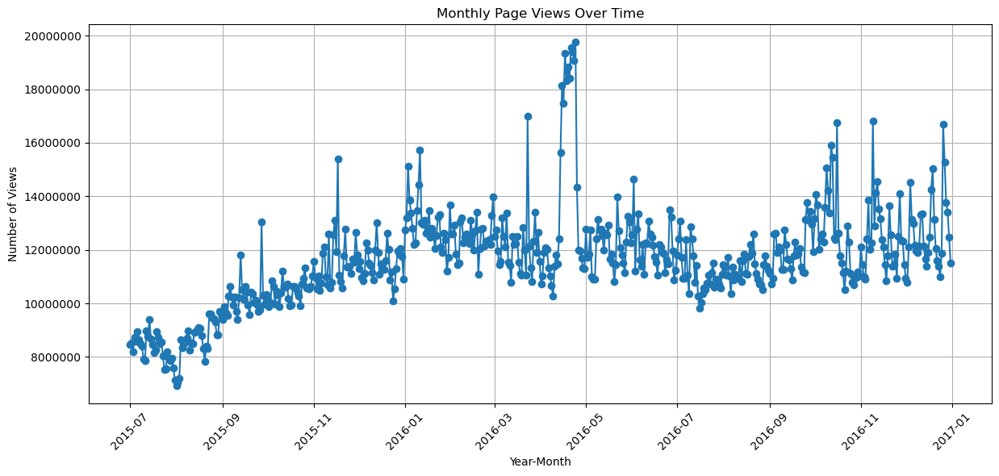

for language:  ja


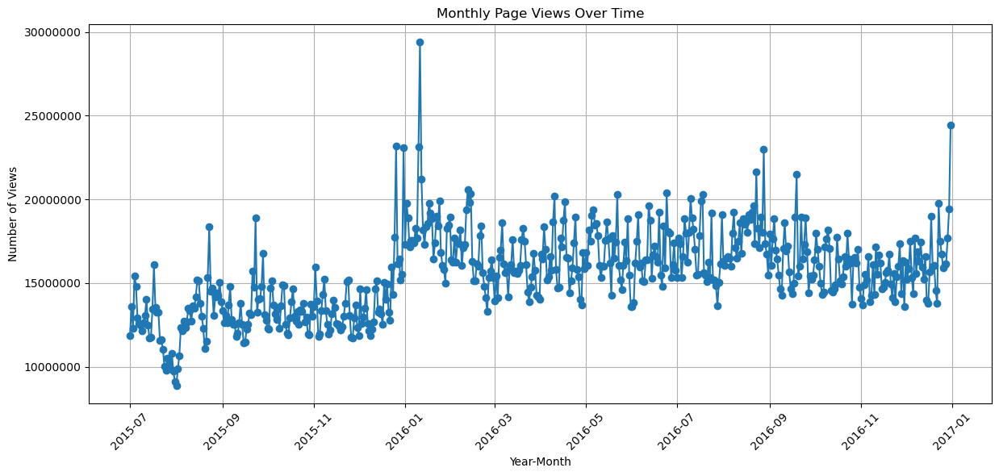

for language:  ru


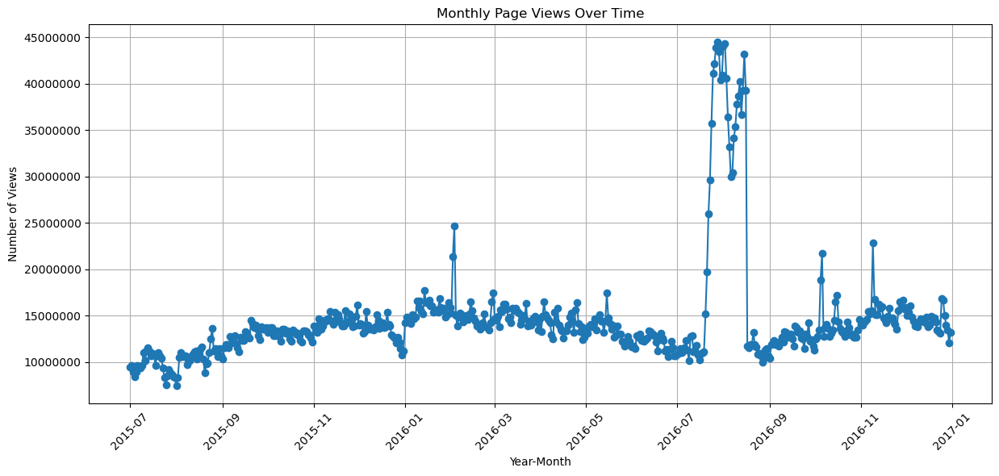

for language:  zh


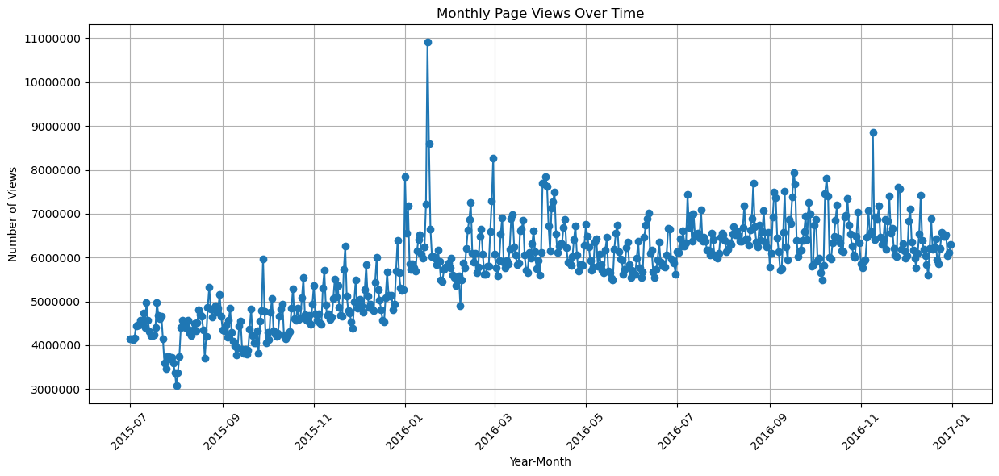

In [542]:
for k,v in language_dfs.items():
    print("for language: ",k)
    de = language_dfs[k][["YearMonthDate","value"]]
    plt.figure(figsize=(12, 6))
    plt.plot(de['YearMonthDate'], de['value'], marker='o', linestyle='-')
    plt.title('Monthly Page Views Over Time')
    plt.xlabel('Year-Month')
    plt.ylabel('Number of Views')
    plt.xticks(rotation=45)
    plt.grid()
    plt.tight_layout()
    plt.ticklabel_format(style='plain', axis='y')
    plt.show()

### There is sudden view jump,spikes in data

# Distribution of views for all languages

de
IS there any nans in data? value    0
dtype: int64


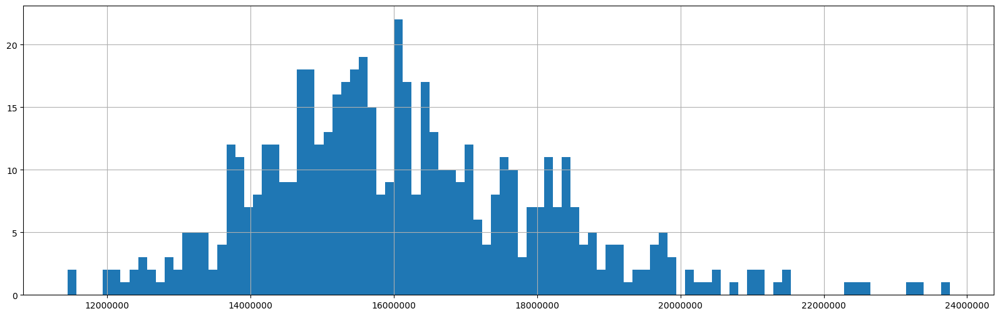

en
IS there any nans in data? value    0
dtype: int64


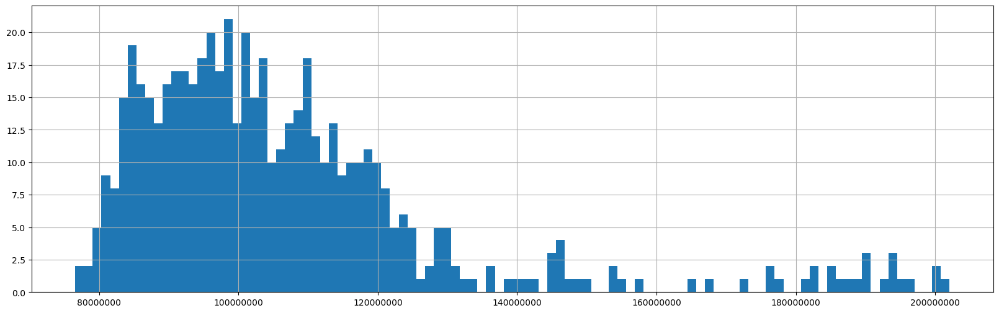

es
IS there any nans in data? value    0
dtype: int64


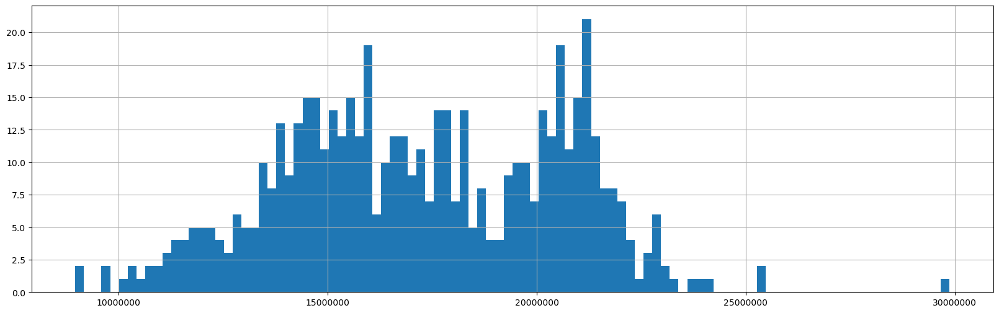

fr
IS there any nans in data? value    0
dtype: int64


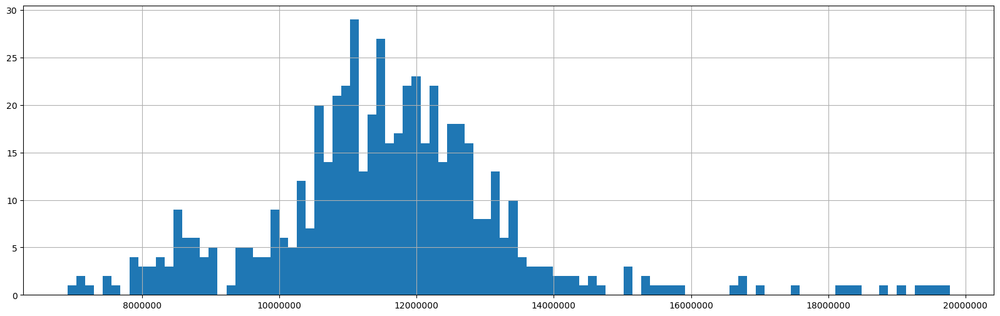

ja
IS there any nans in data? value    0
dtype: int64


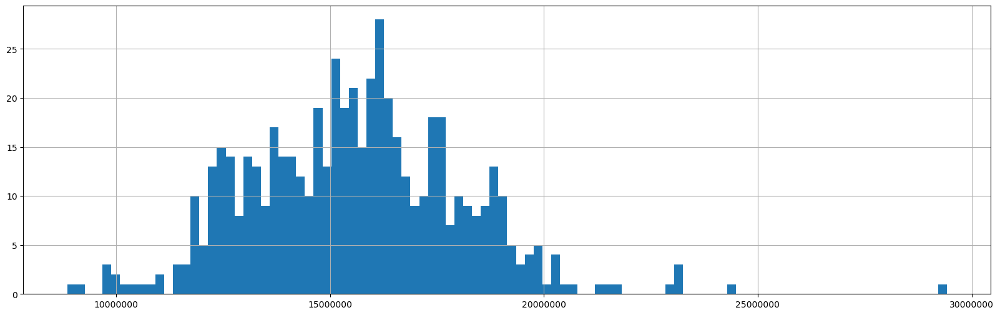

ru
IS there any nans in data? value    0
dtype: int64


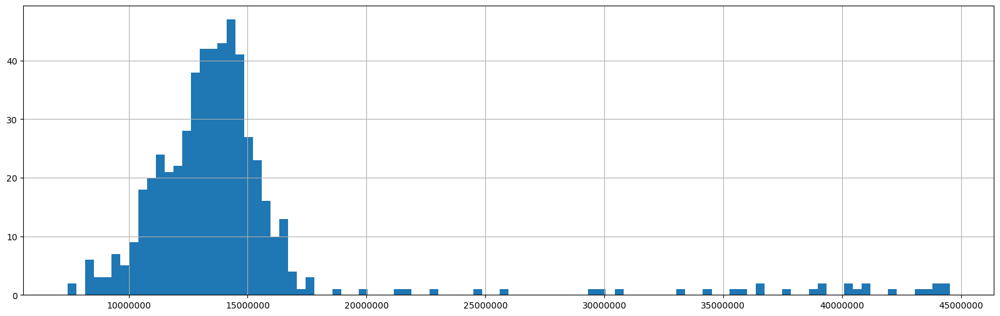

zh
IS there any nans in data? value    0
dtype: int64


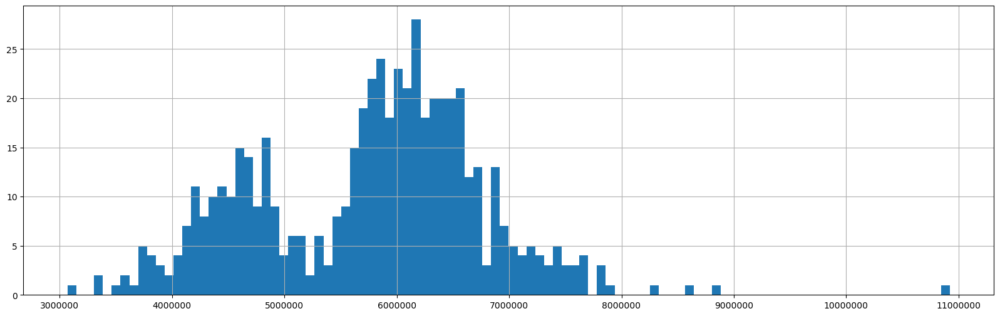

In [575]:
for lang in LANGDF:
    print(lang)
    tmp = LANGDF[lang]
    tmp.index = tmp["YearMonthDate"]
    tmp.drop(["YearMonthDate","Language"],inplace=True,axis=1)
    print("IS there any nans in data?",tmp.isna().sum())
    tmp.value.hist(bins=100).plot()
    plt.ticklabel_format(style='plain', axis='x')
    plt.show()
    print("="*50)

### Most of the data seems to be right skewed

In [582]:
language_dfs

{'de':                     value YearMonthDate day_of_week  is_weekend  is_spike
 YearMonthDate                                                            
 2015-07-01    13260519.00    2015-07-01   Wednesday       False      True
 2015-07-02    13079896.00    2015-07-02    Thursday       False      True
 2015-07-03    12554042.00    2015-07-03      Friday       False      True
 2015-07-04    11520379.00    2015-07-04    Saturday        True      True
 2015-07-05    13392347.00    2015-07-05      Sunday        True     False
 ...                   ...           ...         ...         ...       ...
 2016-12-27    20125264.00    2016-12-27     Tuesday       False      True
 2016-12-28    19152389.00    2016-12-28   Wednesday       False     False
 2016-12-29    18447906.00    2016-12-29    Thursday       False     False
 2016-12-30    17606030.00    2016-12-30      Friday       False     False
 2016-12-31    16562720.00    2016-12-31    Saturday        True     False
 
 [550 rows x 5 co

# Are spikes in data due to weekday/weekend?

for language :  de
   is_weekend day_of_week  is_spike
1       False      Monday        14
3       False     Tuesday         2
4       False   Wednesday         3
2       False    Thursday         3
0       False      Friday         8
5        True    Saturday        15
6        True      Sunday        11


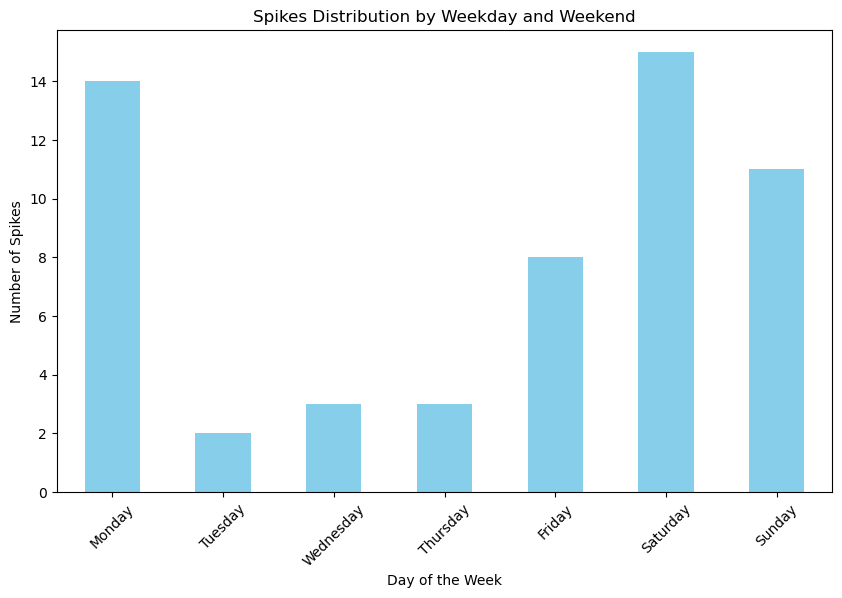

for language :  en
   is_weekend day_of_week  is_spike
1       False      Monday         5
3       False     Tuesday         5
4       False   Wednesday         6
2       False    Thursday         7
0       False      Friday        14
5        True    Saturday        14
6        True      Sunday         5


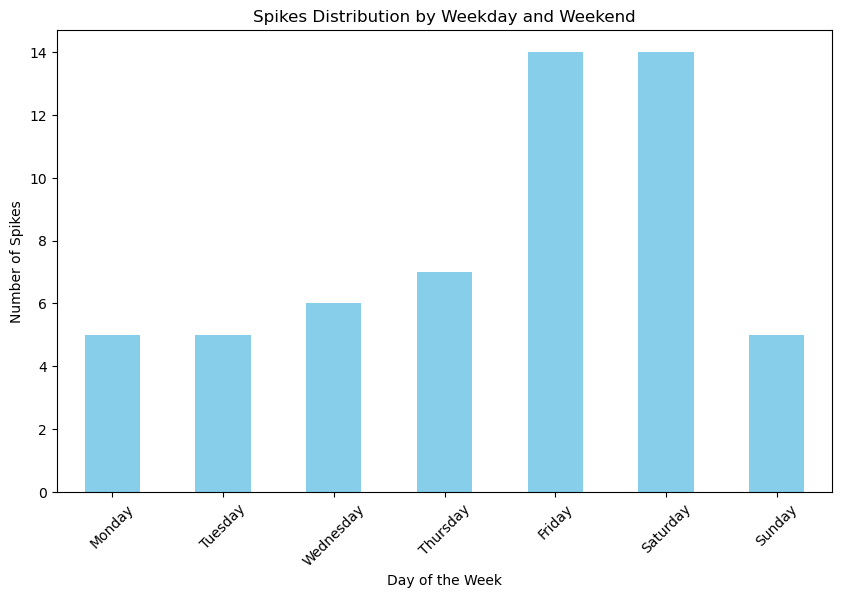

for language :  es
   is_weekend day_of_week  is_spike
1       False      Monday         6
3       False     Tuesday        10
4       False   Wednesday        15
2       False    Thursday         5
0       False      Friday         5
5        True    Saturday        12
6        True      Sunday         3


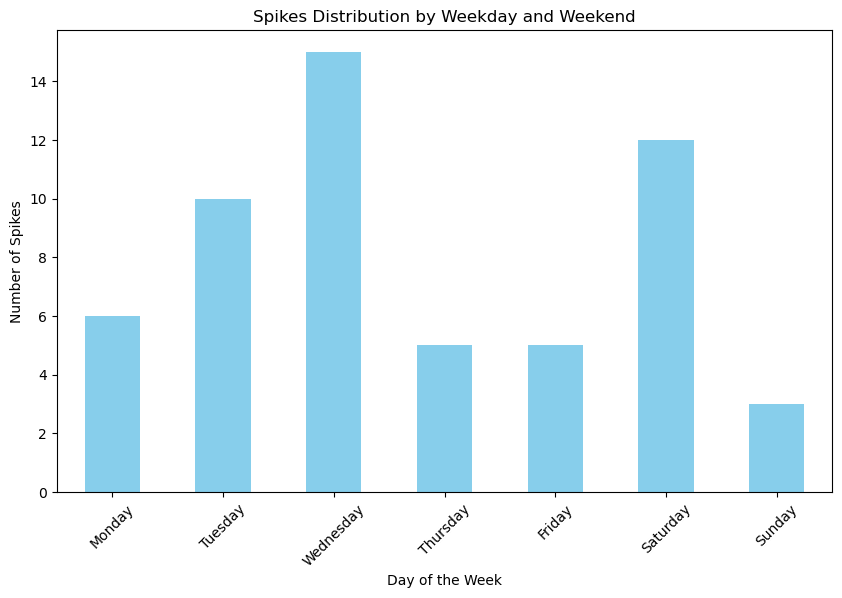

for language :  fr
   is_weekend day_of_week  is_spike
1       False      Monday         8
3       False     Tuesday         4
4       False   Wednesday        10
2       False    Thursday         9
0       False      Friday         8
5        True    Saturday         8
6        True      Sunday         9


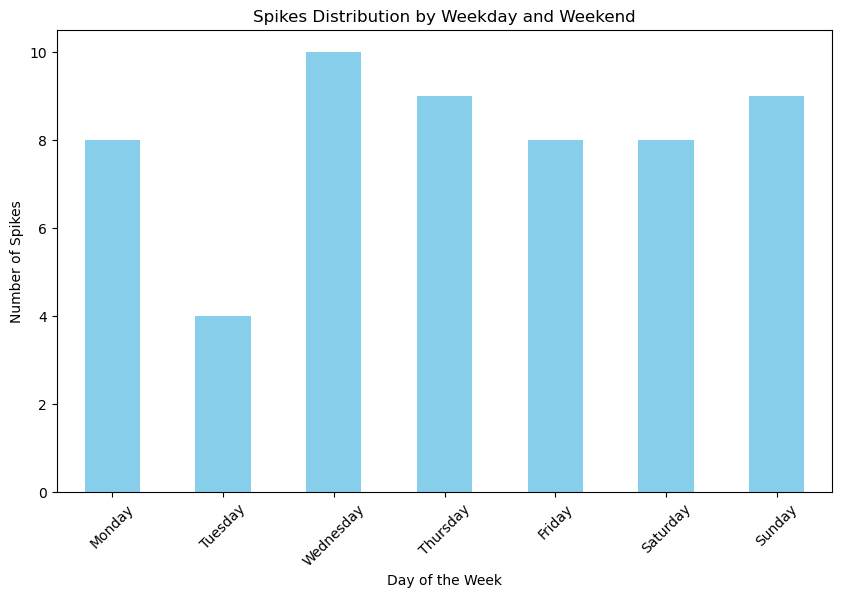

for language :  ja
   is_weekend day_of_week  is_spike
1       False      Monday         5
3       False     Tuesday         7
4       False   Wednesday         7
2       False    Thursday         8
0       False      Friday         9
5        True    Saturday         6
6        True      Sunday        14


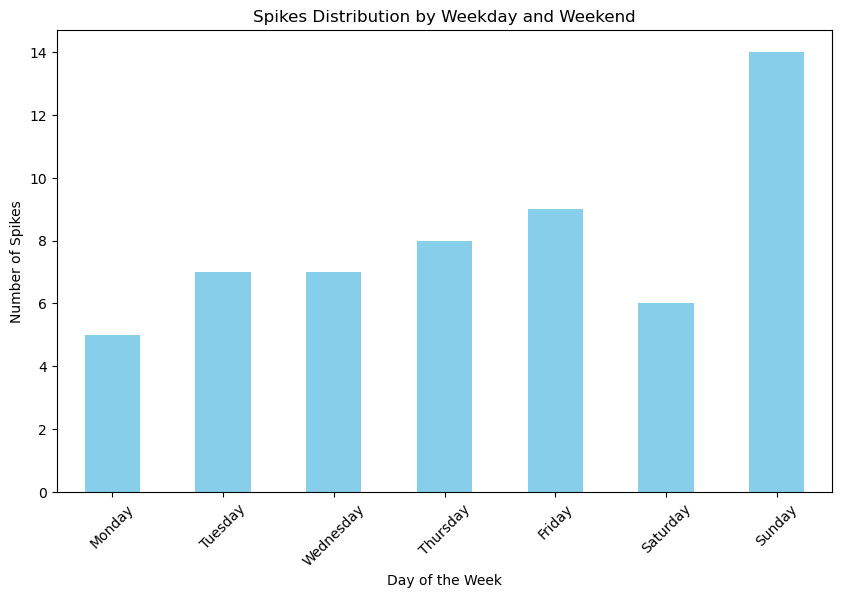

for language :  ru
   is_weekend day_of_week  is_spike
1       False      Monday         7
3       False     Tuesday         6
4       False   Wednesday         8
2       False    Thursday         8
0       False      Friday         8
5        True    Saturday        12
6        True      Sunday         7


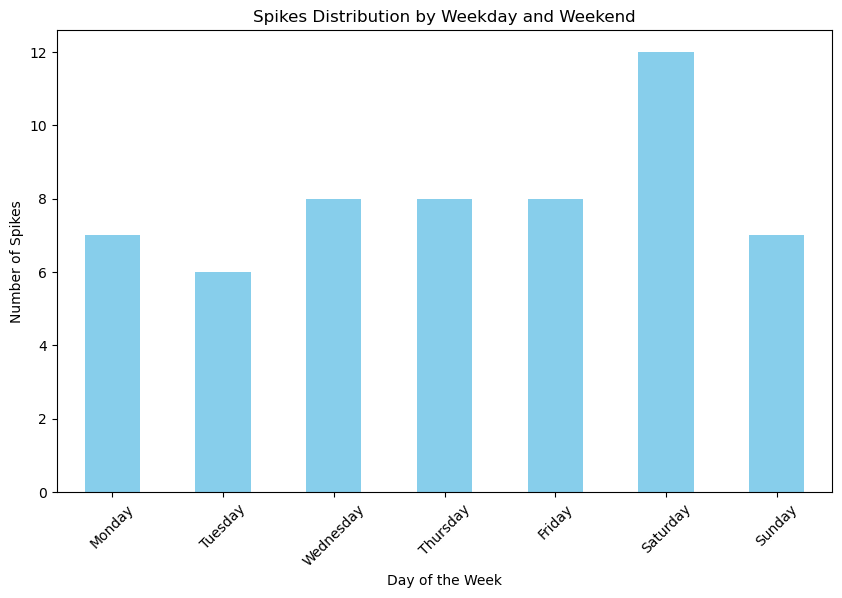

for language :  zh
   is_weekend day_of_week  is_spike
1       False      Monday         7
3       False     Tuesday         6
4       False   Wednesday         6
2       False    Thursday         4
0       False      Friday        10
5        True    Saturday         8
6        True      Sunday        15


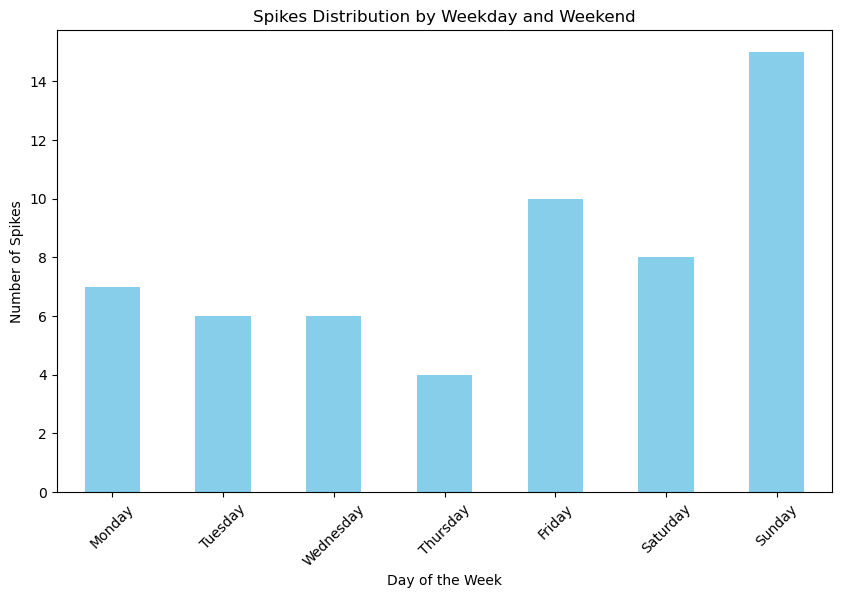

In [624]:
import pandas as pd
import matplotlib.pyplot as plt

def analyze_spikes(df):
    """
    Function to analyze spikes in views data by categorizing them into weekdays and weekends.
    It returns a summary of the number of spikes on each day and visualizes the distribution.
    
    Parameters:
    df (pd.DataFrame): DataFrame with 'YearMonthDate' as index and 'value' column for views data.
    
    Returns:
    pd.DataFrame: Summary of spikes count categorized by weekday/weekend.
    """
    
    # Step 2: Categorize each day as either a 'Weekday' or 'Weekend'
    df['day_of_week'] = df['YearMonthDate'].dt.day_name()  # Get the day name (e.g., Monday, Tuesday)
    df['is_weekend'] = df['day_of_week'].isin(['Saturday', 'Sunday'])  # Identify weekends
    

    # Step 3: Calculate the 5th and 95th percentiles of the 'value' column
    lower_threshold = df['value'].quantile(0.05)
    upper_threshold = df['value'].quantile(0.95)

    # Step 4: Flag the spikes (values above 95th percentile or below 5th percentile)
    df['is_spike'] = ((df['value'] < lower_threshold) | (df['value'] > upper_threshold))

    # Step 5: Group by weekday/weekend and count spikes
    spike_count_by_day = df.groupby(['is_weekend', 'day_of_week'])['is_spike'].sum().reset_index()

    # Step 6: Sort by the day of the week for better clarity
    spike_count_by_day['day_of_week'] = pd.Categorical(spike_count_by_day['day_of_week'], categories=[
        'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], ordered=True)
    spike_count_by_day = spike_count_by_day.sort_values('day_of_week')

    # Step 7: Print the result
    print(spike_count_by_day)

    # Optional: Visualize the result if needed
    spike_count_by_day.set_index('day_of_week')['is_spike'].plot(kind='bar', color='skyblue', figsize=(10, 6))
    plt.title('Spikes Distribution by Weekday and Weekend')
    plt.ylabel('Number of Spikes')
    plt.xlabel('Day of the Week')
    plt.xticks(rotation=45)
    plt.show()

    return spike_count_by_day

for i in [DE,EN,ES,FR,JA,RU,ZH]:
    print("for language : ",i["Language"].iloc[0])
    analyze_spikes(i)

# No, spikes are just random

# Moving average vs Original data

for language :  de


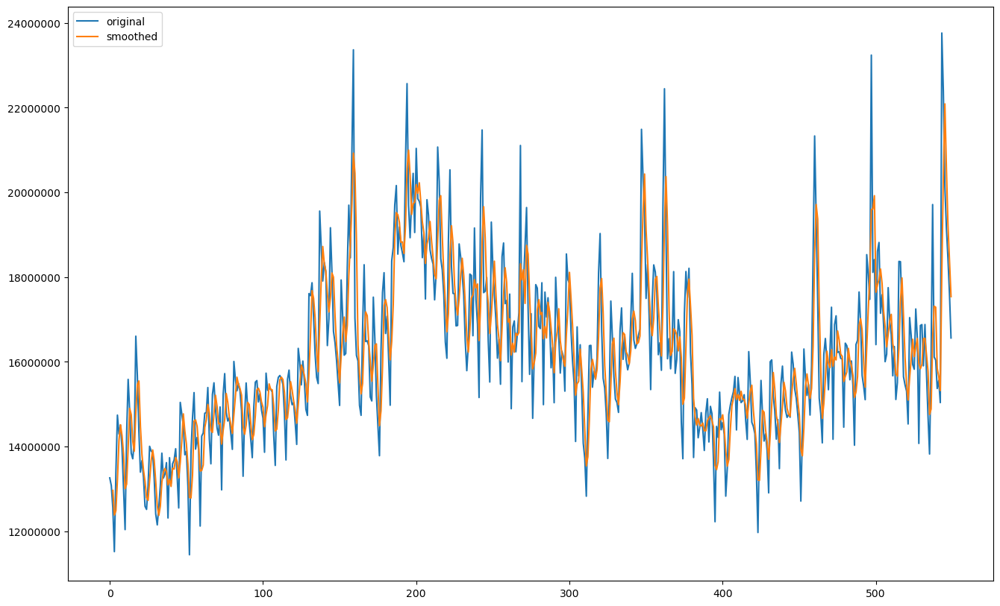

for language :  en


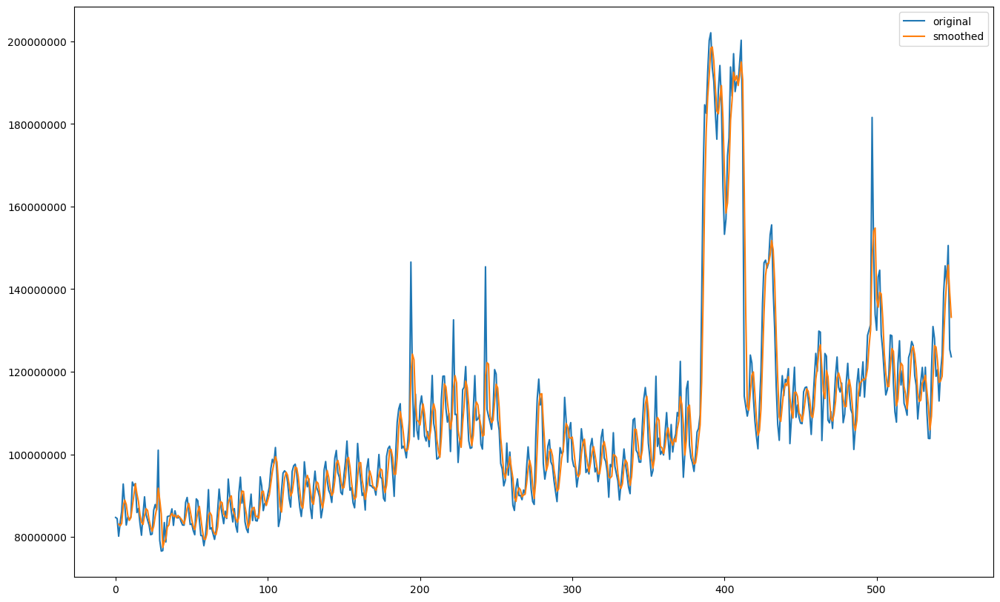

for language :  es


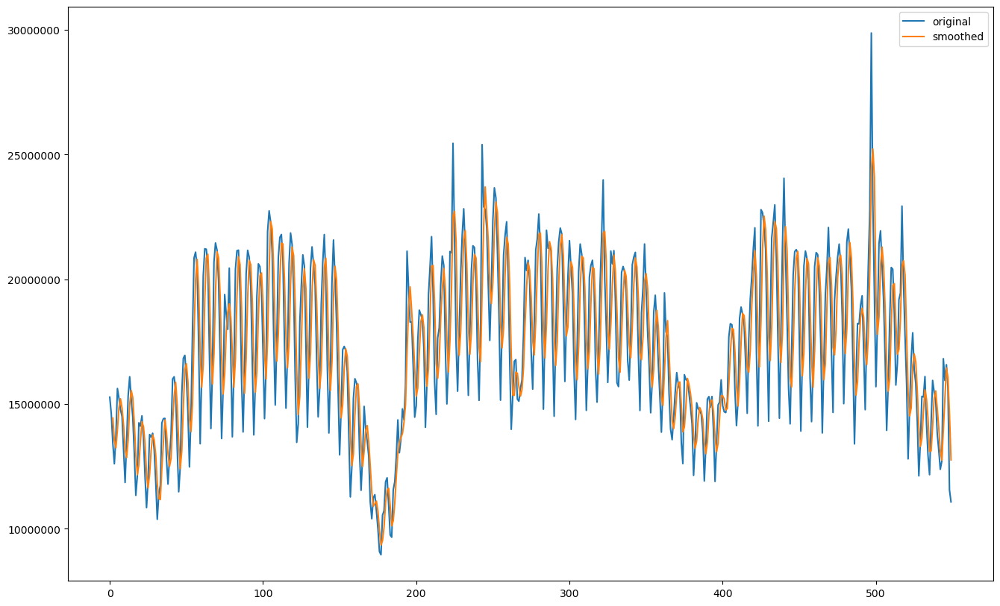

for language :  fr


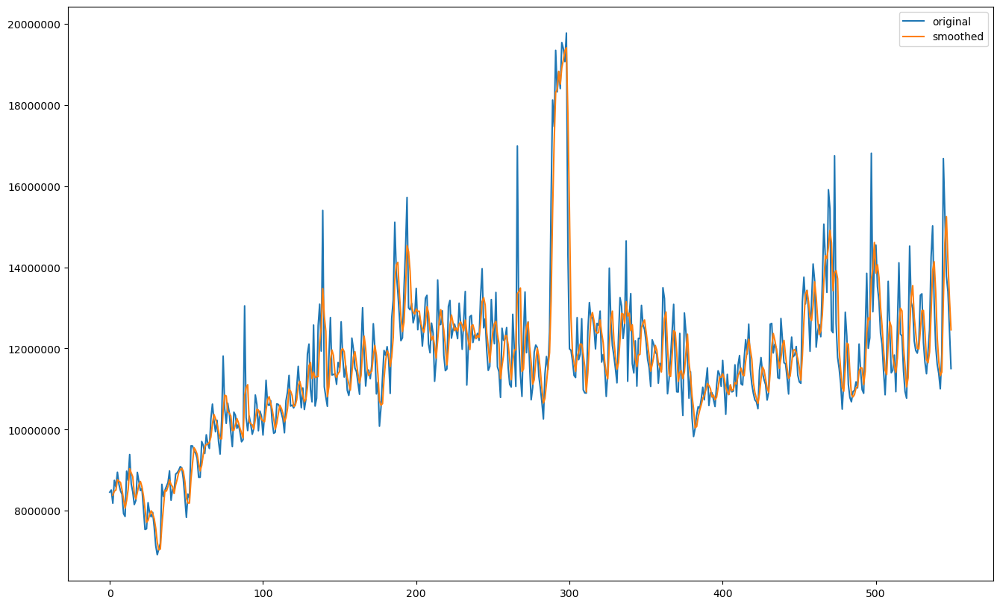

for language :  ja


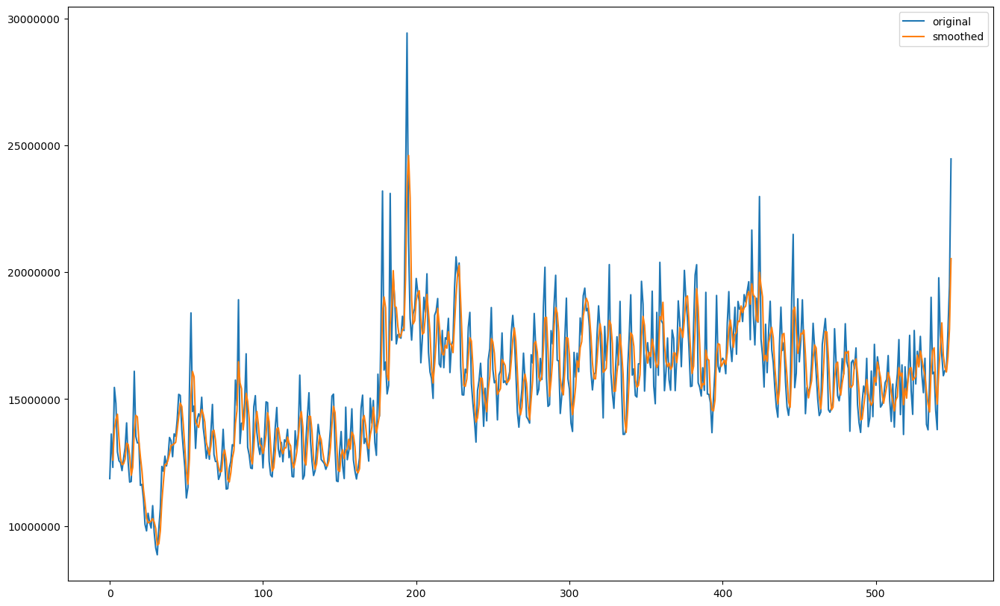

for language :  ru


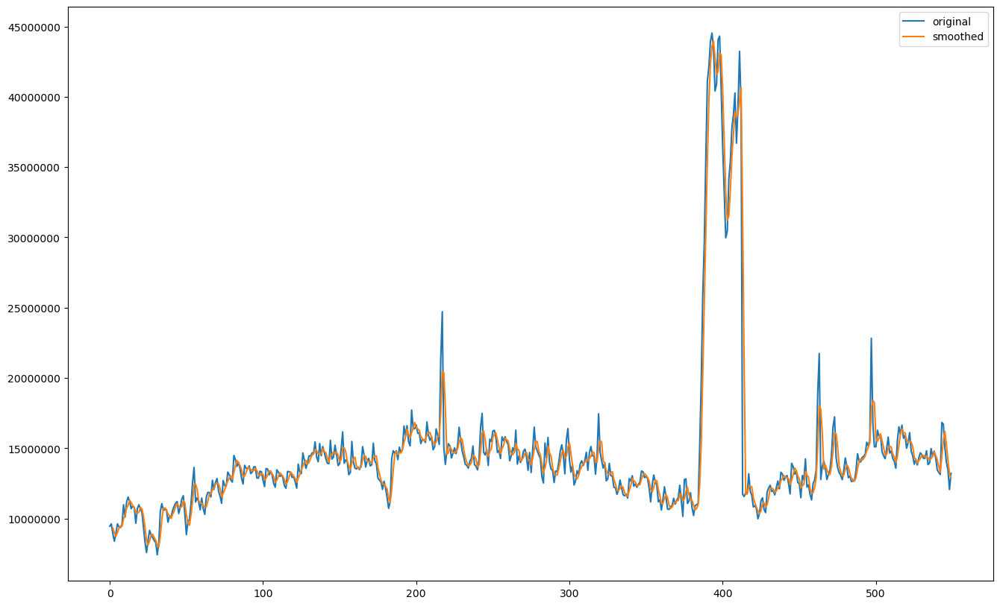

for language :  zh


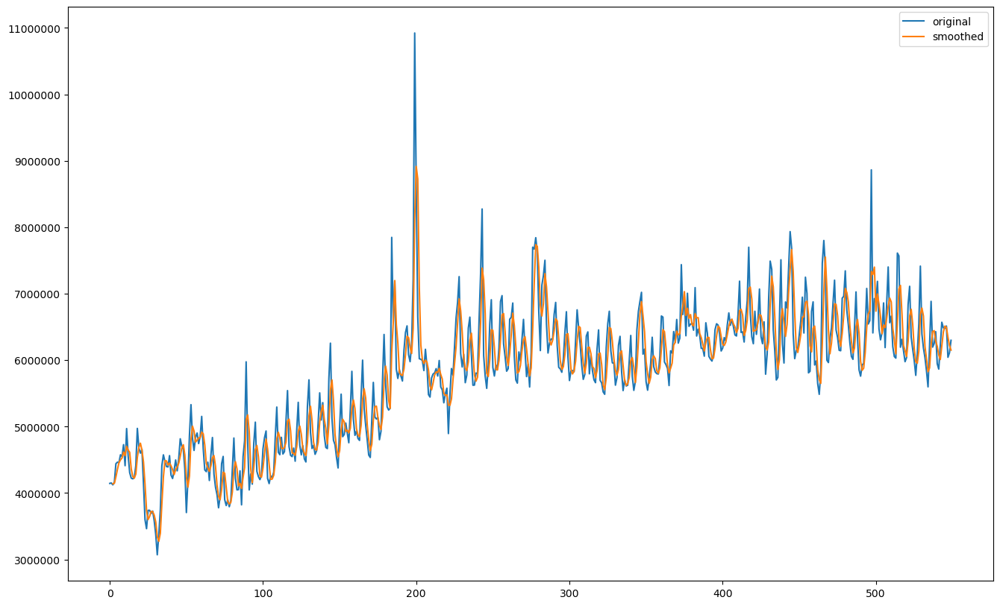

In [629]:
for i in [DE,EN,ES,FR,JA,RU,ZH]:
    print("for language : ",i["Language"].iloc[0])
    # Plot original data
    plt.figure(figsize = (16, 10))
    i.value.plot(label='original')

    # Plot data after implementing Moving Averages
    i.value.rolling(3, center=False).mean().plot(label='smoothed')

    plt.legend()
    plt.ticklabel_format(style='plain', axis='y')
    plt.show()
    print("="*50)

**Possible Interpretations:**

* **Seasonality:** The cyclical pattern suggests that the data might be influenced by seasonal factors.there could be seasonal peaks during certain times of the year.
* **Moving Average Effect:** The smoothed line helps to identify the overall trend and remove short-term noise. This can be useful for forecasting and making informed decisions.
* **Anomalies:** The original series shows some sharp spikes that are not captured by the smoothed line. These could be potential anomalies or outliers that warrant further investigation.

**Further Analysis:**

* **Decomposition:** Decomposing the time series into its trend, seasonality, and residual components can provide a more detailed understanding of its behavior.
* **Anomaly Detection:** Techniques like Isolation Forest or other anomaly detection methods can be used to identify and investigate the potential anomalies.
* **Forecasting:** Time series forecasting models can be used to predict future values of the series based on the observed patterns.

# centre Approach

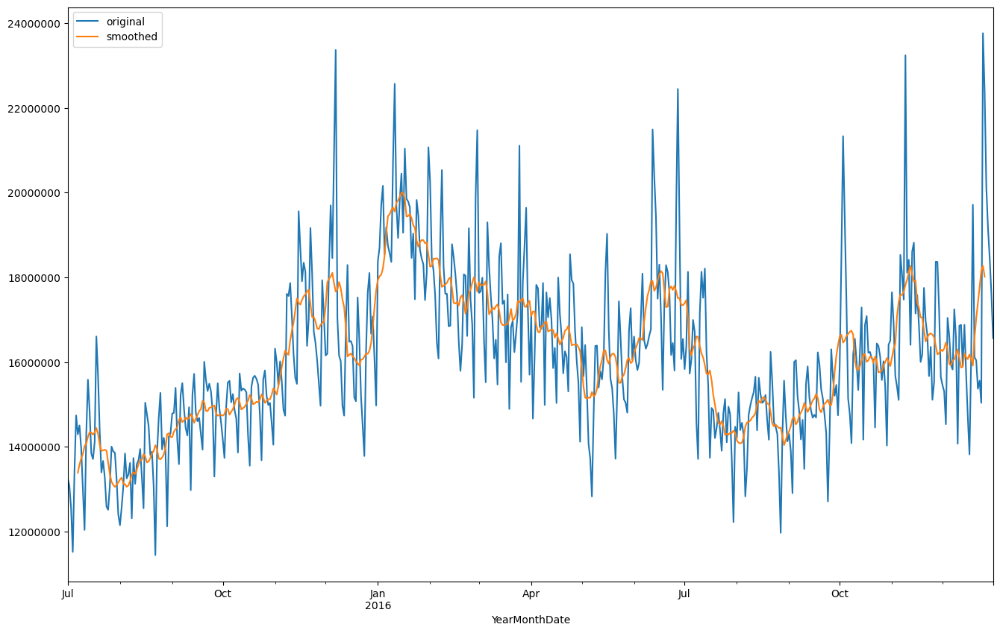

In [59]:
plt.figure(figsize = (16, 10))
de.value.plot(label='original')
de.value.rolling(12, center=True).mean().plot(label='smoothed')
plt.legend()
plt.ticklabel_format(style='plain', axis='y')

It seems that the smoothed line does not exhibit a consistent upward trend. There are periods of increase followed by periods of decrease, suggesting a more complex pattern than a simple upward trend.

Therefore, it is incorrect to say that there is a clear upward trend in the data.

Possible Explanations:

Seasonality: The fluctuations might be primarily driven by seasonal factors, with no clear overall upward or downward direction.

Cyclical Pattern: There could be a cyclical pattern in the data, with recurring periods of growth and decline.
Combination of Factors: The data might be influenced by a combination of factors, including seasonality, cyclical patterns, and potentially some underlying trend that is not easily discernible.
Further Analysis:

To better understand the underlying patterns,we will

Decompose the time series: Break down the data into its trend, seasonality, and residual components. This will help to isolate the trend (if any) from other factors.

# Linear Regresion to identify Trend in data

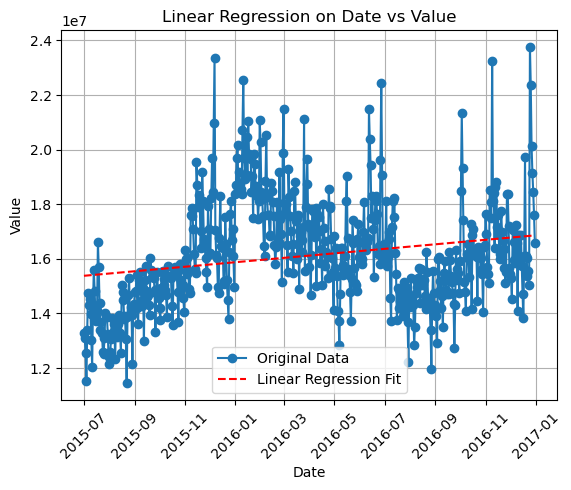

Linear regression model parameters:
Intercept: 15372445.353572018
Slope: 2696.9286738558717


In [85]:
df = pd.DataFrame(data=de)
# Convert the datetime index to numeric (days since the first date)
df['days_since_start'] = (df.index - df.index.min()).days

# Reshape the data for linear regression
X = df['days_since_start'].values.reshape(-1, 1)  # Independent variable
y = df['value'].values  # Dependent variable

# Perform linear regression
model = LinearRegression()
model.fit(X, y)

# Predict the values
df['predicted_values'] = model.predict(X)

# Plot the original values and the predicted values
plt.plot(df.index, de['value'], label='Original Data', marker='o')
plt.plot(df.index, df['predicted_values'], label='Linear Regression Fit', linestyle='--', color='red')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Linear Regression on Date vs Value')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Print the model parameters
print(f'Linear regression model parameters:')
print(f'Intercept: {model.intercept_}')
print(f'Slope: {model.coef_[0]}')


The output of linear regression model indicates the following:

Intercept: 15,372,445.35
This represents the value when the independent variable (days_since_start) is 0. In other words, this is the value predicted for the first day in your dataset (the base value before the trend starts).

Slope: 2,696.93
The slope indicates the amount by which the dependent variable (the value) increases or decreases per unit change in the independent variable (days_since_start). In this case, the slope is positive, meaning the value is increasing by approximately 2,696.93 units per day.

Interpretation:
Positive Slope: Since the slope is positive, it suggests that the value increases as the time progresses. In other words, there is an upward trend in your data.
Intercept: The intercept gives us an idea of the starting point of the trend when time is at 0 (i.e., the first date in your data).

# Seasonality

C:\Users\akash\AppData\Local\Temp\ipykernel_1760\2817331430.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  first_30_days['Day'] = range(1, 31)


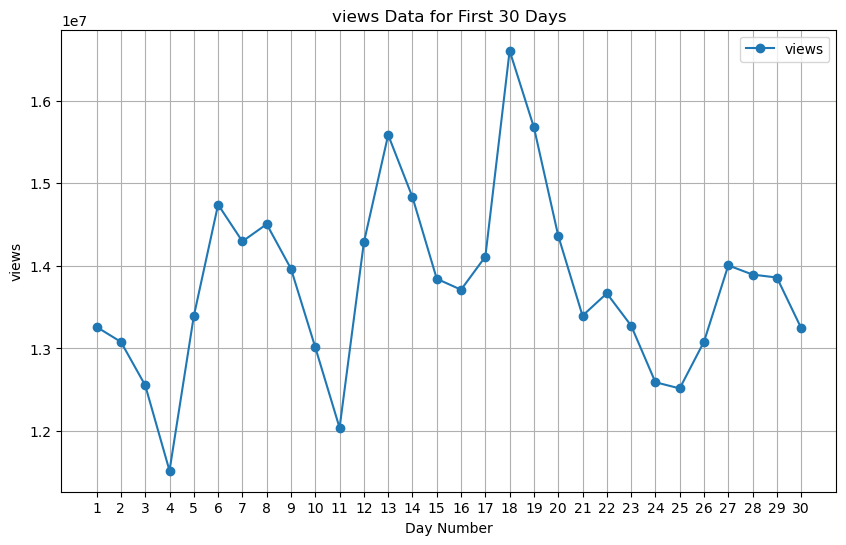

In [88]:
first_30_days = de.head(30)

# Create a day number column
first_30_days['Day'] = range(1, 31)

# Plot the data
plt.figure(figsize=(10, 6))
plt.plot(first_30_days['Day'], first_30_days['value'], label='views', marker='o')
plt.title('views Data for First 30 Days')
plt.xlabel('Day Number')
plt.ylabel('views')
plt.xticks(range(1, 31))  # Set x-ticks to be day numbers
plt.legend()
plt.grid()
plt.show()

# Weekend highlighted

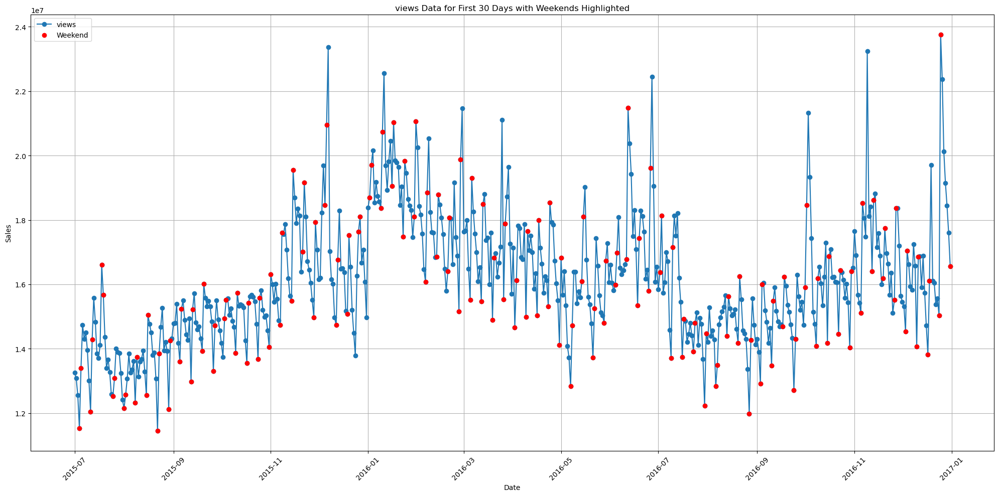

In [89]:
# Create a figure and axis
plt.figure(figsize=(20, 10))

# Plot the sales data
plt.plot(de.index, de['value'], label='views', marker='o')

# Highlight weekends
weekends = de[de.index.weekday >= 5]  # 5 = Saturday, 6 = Sunday
plt.scatter(weekends.index, weekends['value'], color='red', label='Weekend', zorder=5)

# Formatting the plot
plt.title('views Data for First 30 Days with Weekends Highlighted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()

# Show the plot
plt.show()

In [29]:
de.index = de["YearMonthDate"]
de.drop(["YearMonthDate","Language"],inplace=True,axis=1)

en.index = en["YearMonthDate"]
en.drop(["YearMonthDate","Language"],inplace=True,axis=1)

es.index = es["YearMonthDate"]
es.drop(["YearMonthDate","Language"],inplace=True,axis=1)

fr.index = fr["YearMonthDate"]
fr.drop(["YearMonthDate","Language"],inplace=True,axis=1)

ja.index = ja["YearMonthDate"]
ja.drop(["YearMonthDate","Language"],inplace=True,axis=1)

ru.index = ru["YearMonthDate"]
ru.drop(["YearMonthDate","Language"],inplace=True,axis=1)

zh.index = zh["YearMonthDate"]
zh.drop(["YearMonthDate","Language"],inplace=True,axis=1)

# Further EDA

In [42]:
en["date"] = en.index
en = en.reset_index(drop=True)
df = en.copy()

df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.dayofyear
df['weekday'] = df['date'].dt.weekday
df['year-month'] = df['date'].apply(lambda x: str(x.year)+'-'+str(x.month))

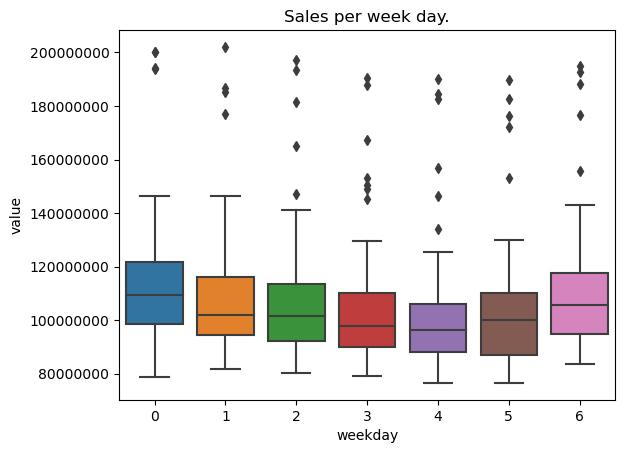

In [55]:
plt.title("views per week day.")
sns.boxplot(x="weekday", y="value", data=df)
plt.ticklabel_format(style='plain', axis='y')

## August has spike in views

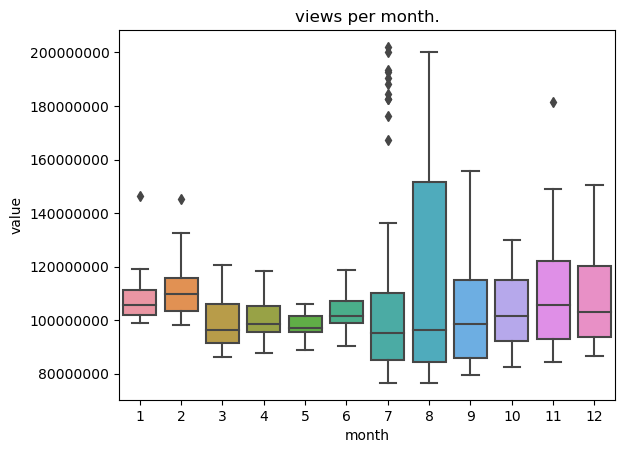

In [58]:
plt.title("views per month.")
sns.boxplot(x="month", y="value", data=df)
plt.ticklabel_format(style='plain', axis='y')

## July august has sudden spikes in views

<Axes: title={'center': 'views per Year-Month'}, xlabel='year-month', ylabel='value'>

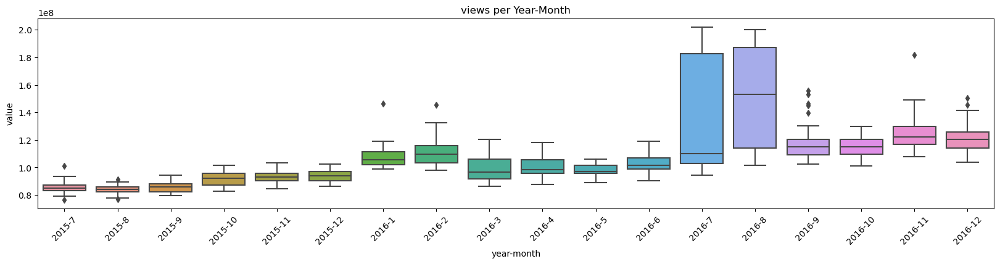

In [60]:
plt.figure(figsize=(20,4))
plt.xticks(rotation=45)
plt.title('views per Year-Month')
sns.boxplot(x="year-month", y="value", data=df)

## Each week day has almost equalno. of views

<Axes: title={'center': 'views per Year-Month'}, xlabel='weekday', ylabel='value'>

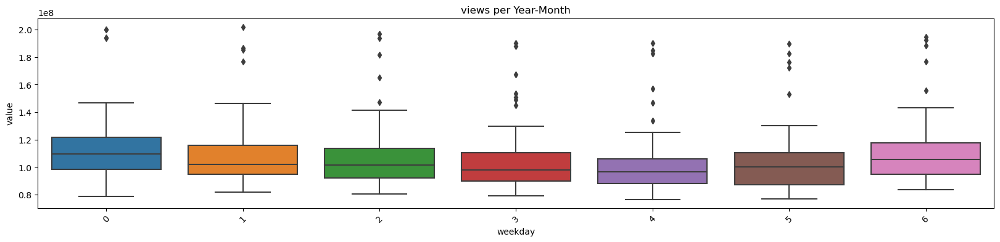

In [79]:
plt.figure(figsize=(20,4))
plt.xticks(rotation=45)
plt.title('views per Year-Month')
sns.boxplot(x="weekday", y="value", data=df)

## Weekly seasonality can be seen in data

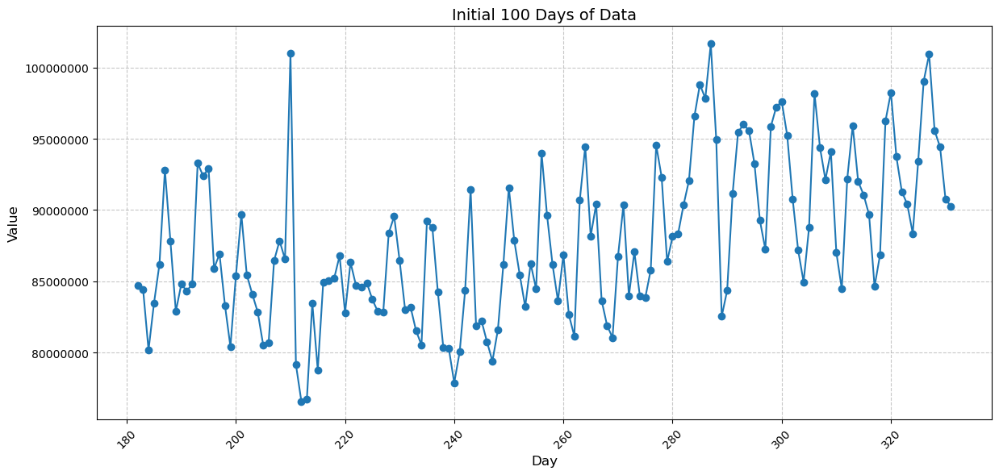

In [73]:
plt.figure(figsize=(12, 6))
plt.plot(df['day'].head(150), df['value'].head(150), marker='o', linestyle='-')
plt.title('Initial 100 Days of Data', fontsize=14)
plt.xlabel('Day', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.ticklabel_format(style='plain', axis='y')
plt.show()

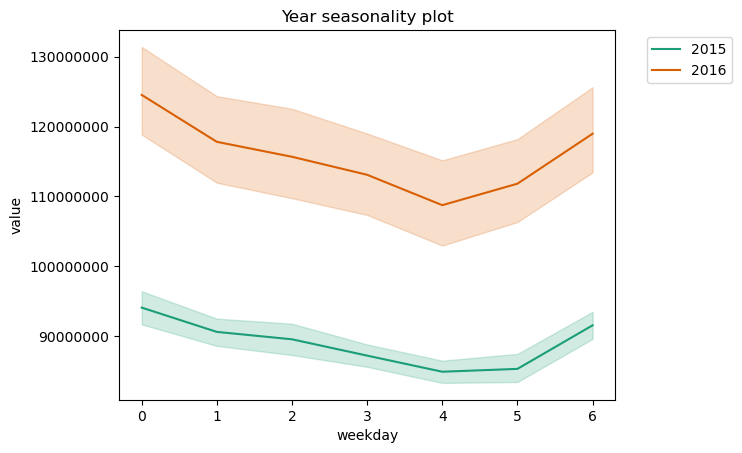

In [82]:
sns.lineplot(data=df, 
             x='weekday', 
             y='value', 
             hue='year', 
             legend='full',
            palette='Dark2')

# add title
plt.title('Year seasonality plot')

# move the legend outside of the main figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2);
plt.ticklabel_format(style='plain', axis='y')

# Coefficient of variance over time to check if its multiplicative or additive

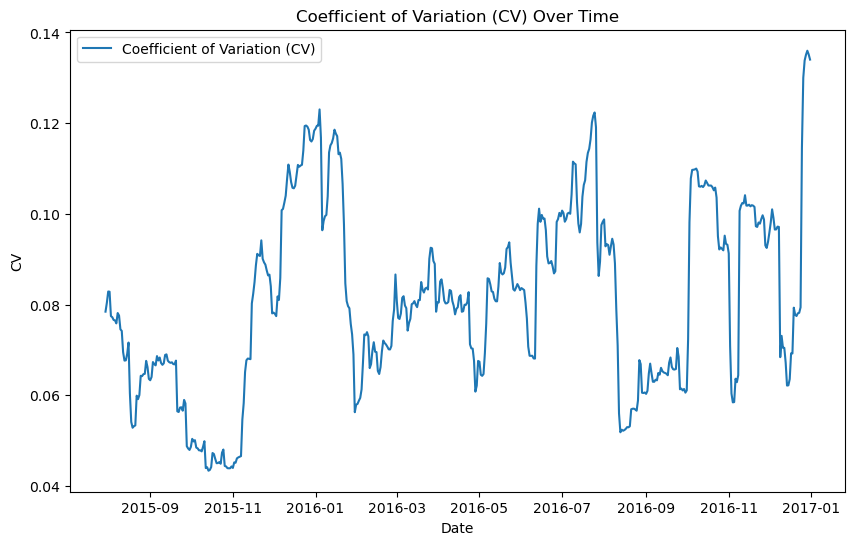

In [647]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate Coefficient of Variation (CV) over a rolling window
def calculate_cv(df, window=30):
    """
    Calculate the coefficient of variation (CV) over a rolling window.
    
    :param df: pandas DataFrame with the time series data
    :param window: Rolling window size (default is 30 days)
    :return: pandas Series with the CV for each window
    """
    # Calculate rolling mean and rolling standard deviation
    rolling_mean = df['value'].rolling(window=window).mean()
    rolling_std = df['value'].rolling(window=window).std()
    
    # Calculate Coefficient of Variation (CV) = std / mean
    cv = rolling_std / rolling_mean
    
    return cv



# Calculate CV with a rolling window of 30 days
cv = calculate_cv(de, window=30)

# Plot the CV over time
plt.figure(figsize=(10, 6))
plt.plot(cv, label='Coefficient of Variation (CV)')
plt.title('Coefficient of Variation (CV) Over Time')
plt.xlabel('Date')
plt.ylabel('CV')
plt.legend()
plt.show()


## Not much variance so it seems to be additive

# Decomposition

<Figure size 1200x800 with 0 Axes>

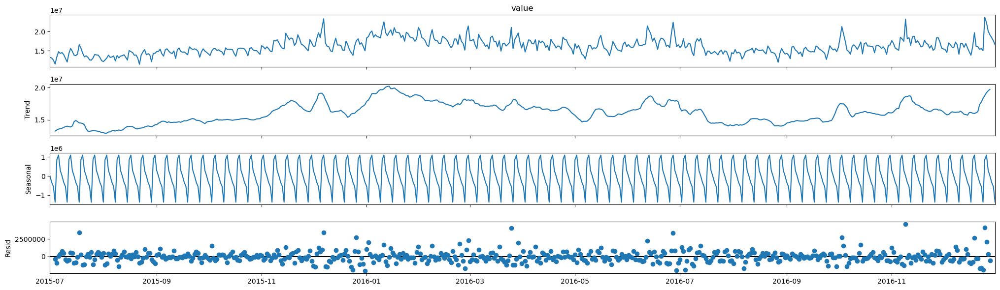

<Figure size 1200x800 with 0 Axes>

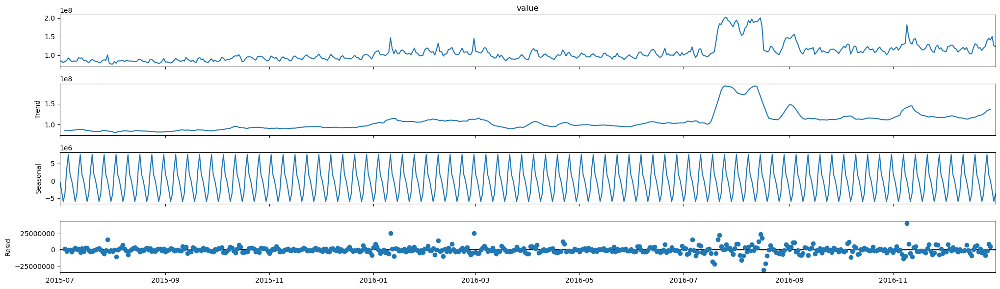

<Figure size 1200x800 with 0 Axes>

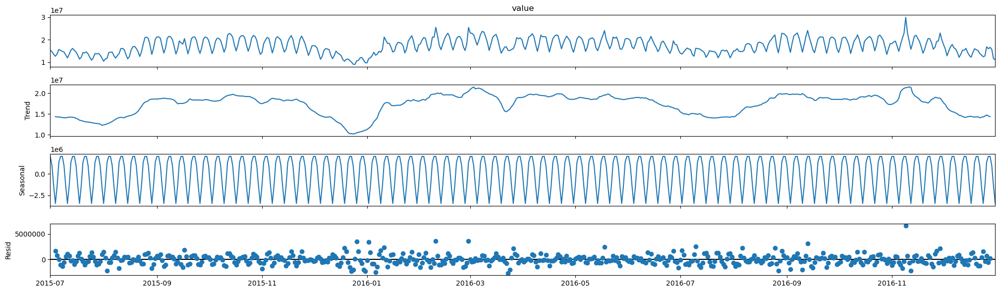

<Figure size 1200x800 with 0 Axes>

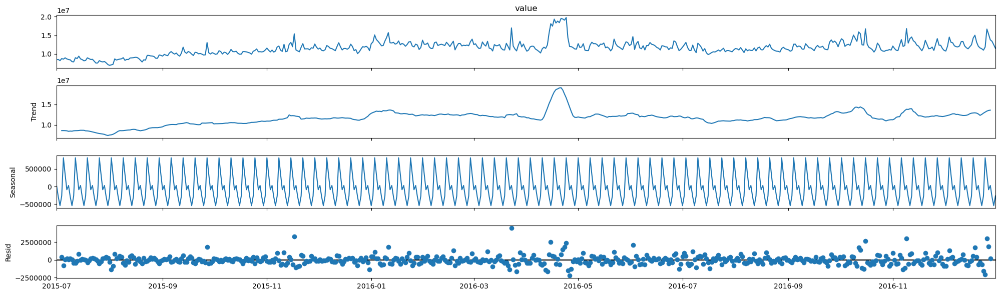

<Figure size 1200x800 with 0 Axes>

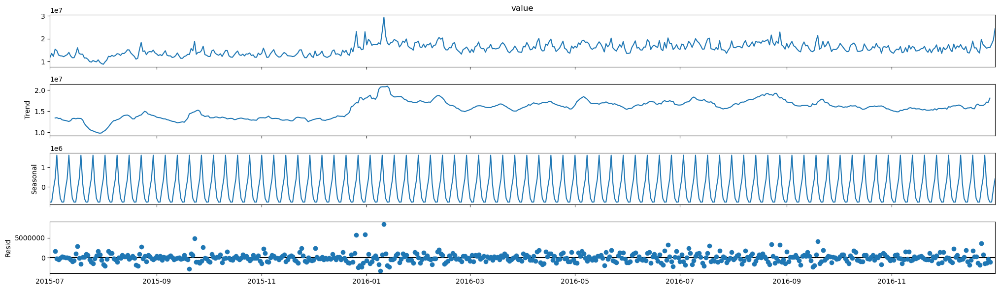

<Figure size 1200x800 with 0 Axes>

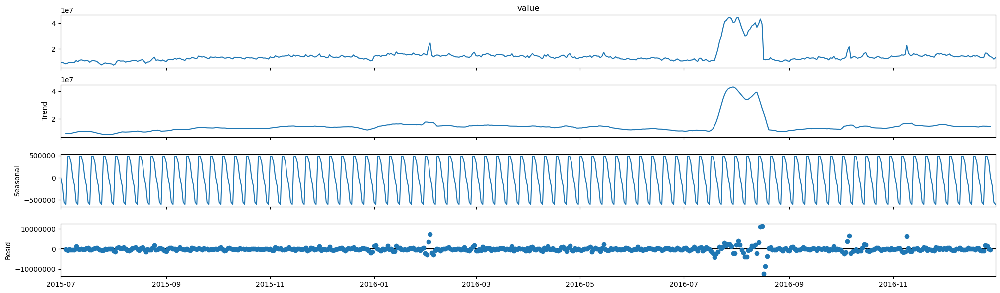

<Figure size 1200x800 with 0 Axes>

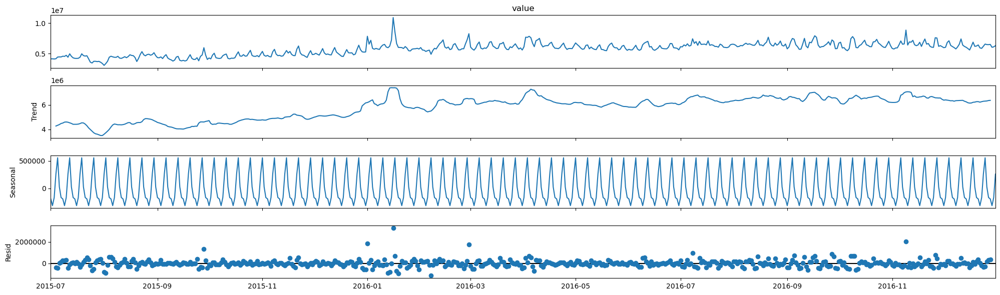

In [660]:
import statsmodels.api as sm
for i in [de,en,es,fr,ja,ru,zh]:
    model = sm.tsa.seasonal_decompose(i.value, model='additive',period = 7)
    plt.figure(figsize=(12, 8)) 
    model.plot()
    plt.ticklabel_format(style='plain', axis='y')
    plt.show()
    print("="*50)

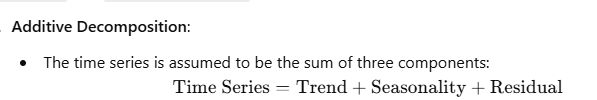

# Lets plot Residuals

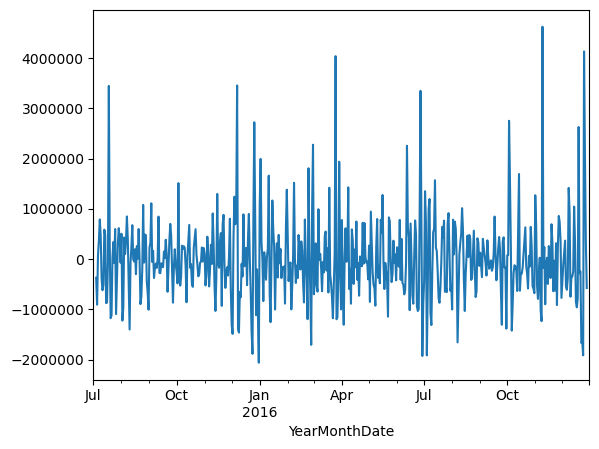

In [93]:
model.resid.plot()
plt.ticklabel_format(style='plain', axis='y')

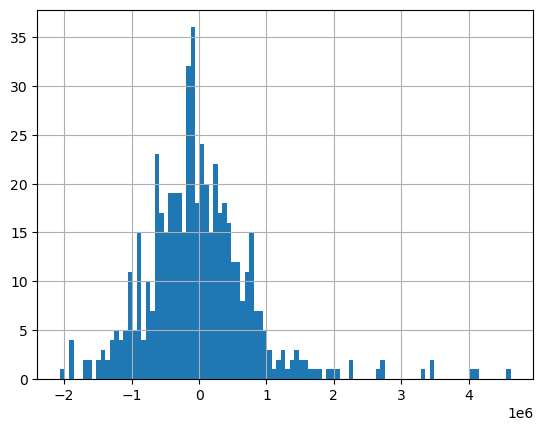

In [94]:
model.resid.hist(bins=100)
plt.ticklabel_format(style='plain', axis='y')

Observations:

Shape: The histogram appears to be roughly bell-shaped, suggesting that the residuals might be approximately normally distributed.

Symmetry: The distribution seems to be somewhat skewed to the right, indicating that there might be a few larger positive residuals compared to negative ones.

Central Tendency: The distribution is centered around zero, which is expected for residuals.

Interpretation:

Normality: The approximately bell-shaped distribution suggests that the residuals might be normally distributed. This is a desirable property for many time series models, as it supports the assumption of normally distributed errors.

Skewness: The slight right-skewness indicates that there might be a few larger positive outliers in the data. These outliers could be investigated further to understand their potential causes.

Central Tendency: The fact that the distribution is centered around zero indicates that the model is, on average, predicting the values of the time series accurately.

# Residual deviation

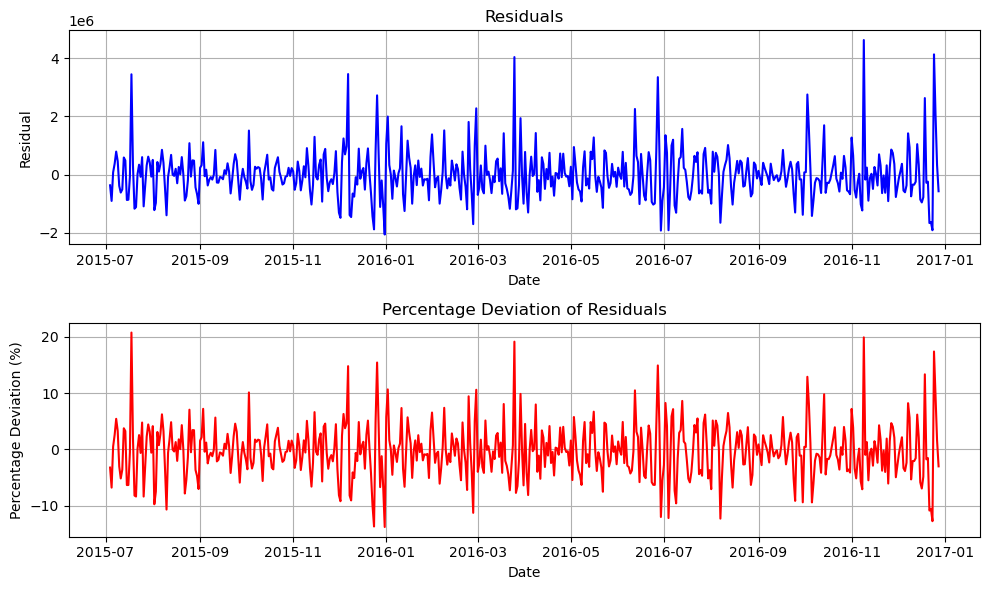

YearMonthDate
2015-07-01     NaN
2015-07-02     NaN
2015-07-03     NaN
2015-07-04   -3.22
2015-07-05   -6.78
dtype: float64


In [95]:
# Step 2: Extract the residuals and original values
residuals = model.resid
original_values = de['value']

# Step 3: Calculate the percentage deviation of residuals
# Percentage Deviation = (Residuals / Original Value) * 100
percentage_deviation = (residuals / original_values) * 100

# Step 4: Plot the residuals and percentage deviation
plt.figure(figsize=(10, 6))

# Plot the residuals
plt.subplot(2, 1, 1)
plt.plot(de.index, residuals, label='Residuals', color='blue')
plt.title('Residuals')
plt.xlabel('Date')
plt.ylabel('Residual')
plt.grid(True)

# Plot the percentage deviation
plt.subplot(2, 1, 2)
plt.plot(de.index, percentage_deviation, label='Percentage Deviation of Residuals', color='red')
plt.title('Percentage Deviation of Residuals')
plt.xlabel('Date')
plt.ylabel('Percentage Deviation (%)')
plt.grid(True)

plt.tight_layout()
plt.show()

# Print first few rows of the percentage deviation
print(percentage_deviation.head())

In [97]:
model.resid.mean()

1521.3579719609581

In [99]:
de["value"].max()

23760349.0

In [100]:
de["value"].min()

11445863.0

Let's compare the mean residual to the range of values in the "value" column:

The range between the max and min values is:
    23760349.0 - 11445863.0 = 12,314,486.0
    1521/12,314,486.0 = 0.01%
    
This means that the mean residual is about 0.0123% of the total range of the data.

# Generating Forecasts

In [666]:
de.drop("rolling_variance",inplace=True,axis=1)

## train test split

In [668]:
train_max_date = de.index[-31]
train_x = de.loc[de.index < de.index[-31]].copy()
test_x = de.loc[de.index >= de.index[-31]].copy()

test_x

,value
YearMonthDate,
2016-12-01,15455209.00
2016-12-02,15306968.00
2016-12-03,14533278.00
2016-12-04,17043361.00
2016-12-05,16618905.00
2016-12-06,15934483.00
2016-12-07,15824540.00
2016-12-08,17246991.00
2016-12-09,16578087.00


# 1. Forecasting mean

MAE : 1501482.403
RMSE : 2323758.334
MAPE: 0.082


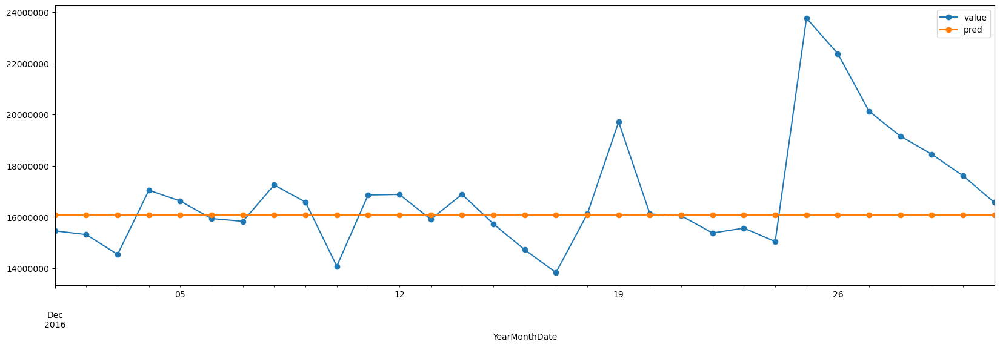

In [670]:
test_x['pred'] = train_x['value'].mean()

test_x.plot(style='-o')

performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')

In [108]:
(1501482.403/16070574.173410404)*100

9.343053874728884

In this case, we can interpret it as, given that the model's values fluctuate between roughly 14m to 24m, and within those fluctuations, this model's error is around 1.5m approx.

The mean of data is approx 16m, and we're getting an MAE of 1.5m, this means roughly 9% predictions are wrong, with respect to the mean.

This is not good.

# 2. Naive Approach

MAE : 1619581.548
RMSE : 2492320.761
MAPE: 0.087


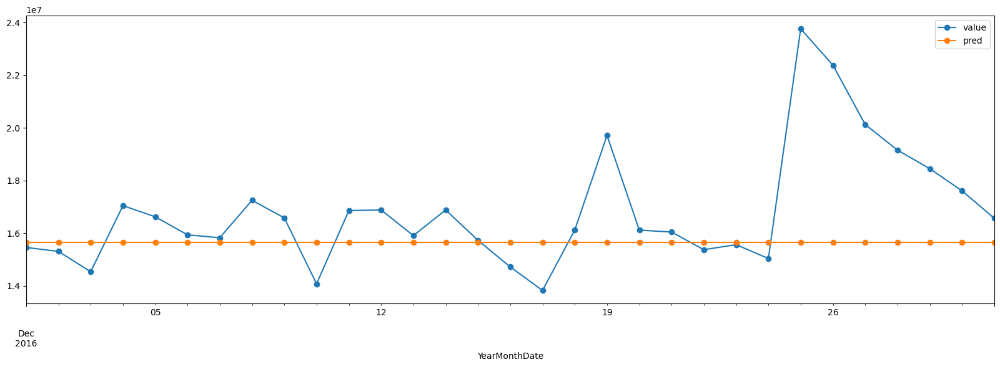

In [671]:
test_x['pred'] = train_x['value'][-1]

test_x.plot(style='-o')

performance(test_x['value'], test_x['pred'])

In [110]:
(1619581.548/16070574.173410404)*100

10.077932067167092

roughly 10% predictions are wrong, with respect to the mean.

# 3. Seasonal Naive

MAE : 2177664.484
RMSE : 2871461.05
MAPE: 0.126


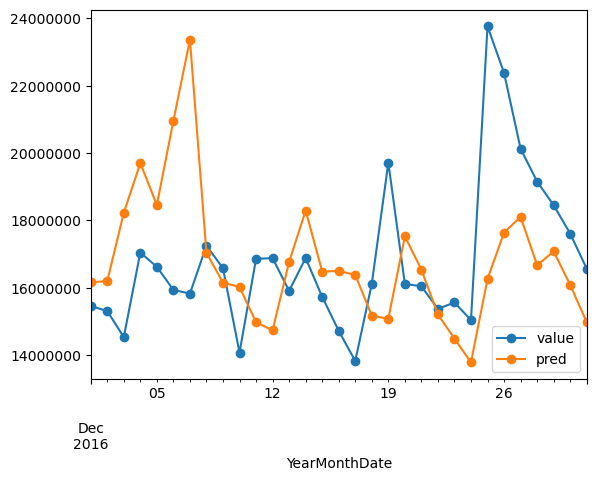

In [112]:
for i in test_x.index:
    test_x.loc[i, 'pred'] = train_x.loc[i - pd.DateOffset(years=1), 'value']

test_x.plot(style='-o')

performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')

# 4. drift method

MAE : 1582933.927
RMSE : 2443860.619
MAPE: 0.085


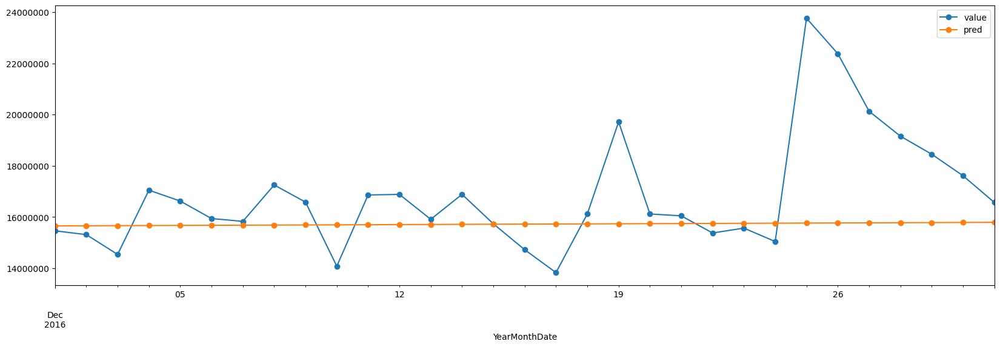

In [672]:
# Get the slope
y_t = train_x['value'][-1]
m = (y_t - train_x['value'][0]) / len(train_x)
h = np.linspace(0,len(test_x)-1, len(test_x))

test_x['pred'] = y_t + m * h

test_x.plot(style='-o')

performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')

# Smoothing based methods

## 1. Moving average forecasting

In [28]:
df = de.copy()

In [142]:
pd.date_range(start=df.index[-1],periods=32,freq='D').shape

(32,)

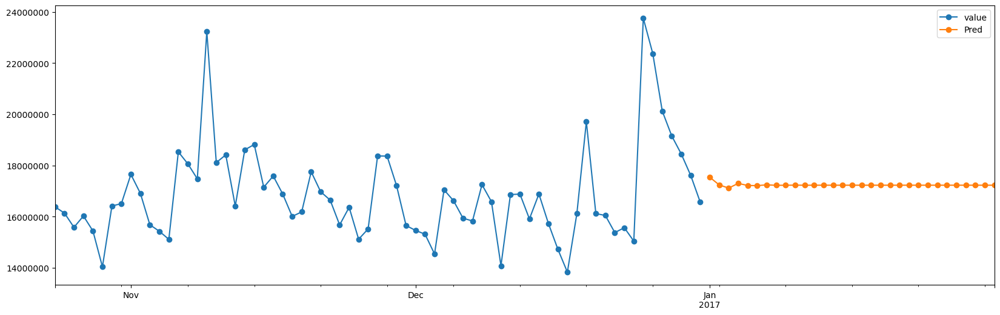

In [676]:
df_combined = pd.concat([df, pd.DataFrame(index = pd.date_range(start=df.index[-1], periods=32,freq='D')[1:])])
pred = df_combined.value.dropna().values
for i in range(31):
  pred = np.append(pred, pred[-3:].mean())

df_combined['Pred'] = pred

df_combined.loc[~df_combined['value'].isna(), 'Pred'] = np.nan
df_combined.tail(100).plot(style='-o')
plt.ticklabel_format(style='plain', axis='y')

In [29]:
last_date = df.index.max()  # Get the most recent date in the dataset
cutoff_date = last_date - pd.Timedelta(days=31)  # Calculate the cutoff for 31 days ago

# Step 2: Split the data into train and test
train_x = df[df.index <= cutoff_date]  # All data before the cutoff date
test_x = df[df.index > cutoff_date] 

MAE : 2062726.015
RMSE : 2401229.701
MAPE: 0.124


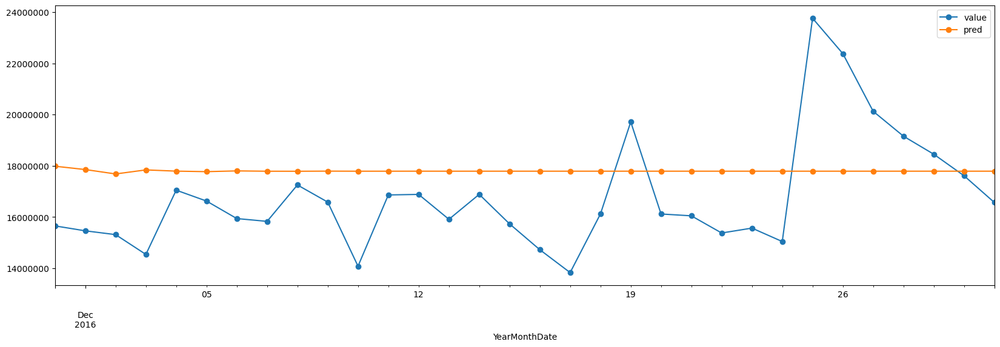

In [687]:
df = train_x.copy()

df = pd.concat([df,pd.DataFrame(index = pd.date_range(start=df.index[-1], periods=31,freq='D')[1:])])

pred = df.value.dropna().values

for i in range(32):
  pred = np.append(pred, pred[-3:].mean())

test_x['pred'] = pred[-32:]
test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')

## 2. Simple exponential smoothing

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\pandas\util\_decorators.py:210: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)
C:\Users\akash\AppData\Local\Temp\ipykernel_1760\4092709577.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_x['pred'] = model.forecast(steps = 31)


MAE : 1574172.76
RMSE : 2200328.814
MAPE: 0.09


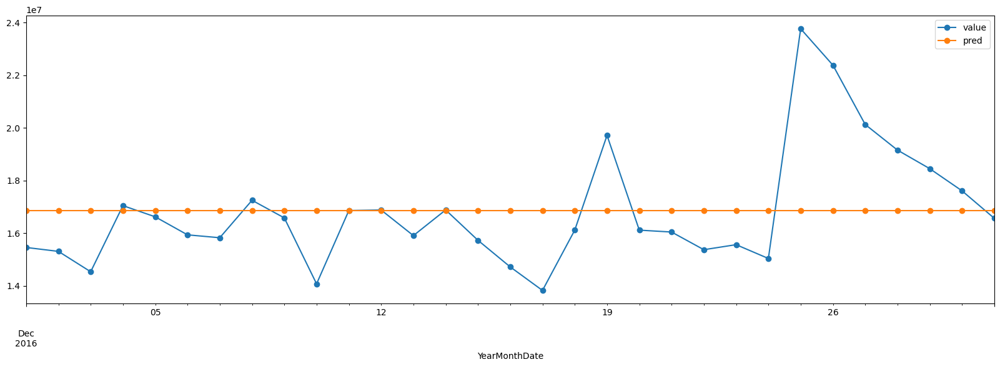

In [707]:
model = sm.tsa.SimpleExpSmoothing(train_x.value).fit(smoothing_level=0.1)
test_x['pred'] = model.forecast(steps = 31)
test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])

As expected, the prediction is a straight line, but the erros is 10% which is less than the error of moving average.

So this model is performing better.


The SES Model is missing both

trend, and
seasonality

# 3. Adding Trend to Exponential smoothing

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


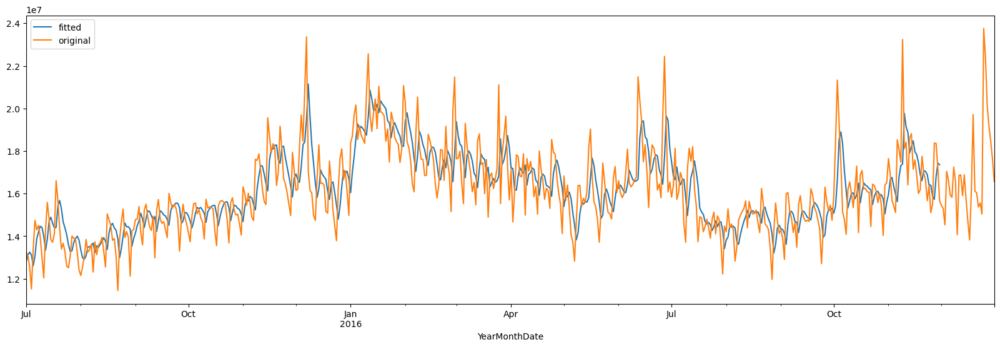

In [713]:
model = sm.tsa.ExponentialSmoothing(train_x.value, trend='add').fit(smoothing_level=0.4)
model.fittedvalues.plot(label='fitted')
de.value.plot(label='original')
plt.legend()

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\akash\AppData\Local\Temp\ipykernel_1760\2246187713.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_x['pred'] = model.forecast(steps = 31)


MAE : 1537707.062
RMSE : 2176328.887
MAPE: 0.087


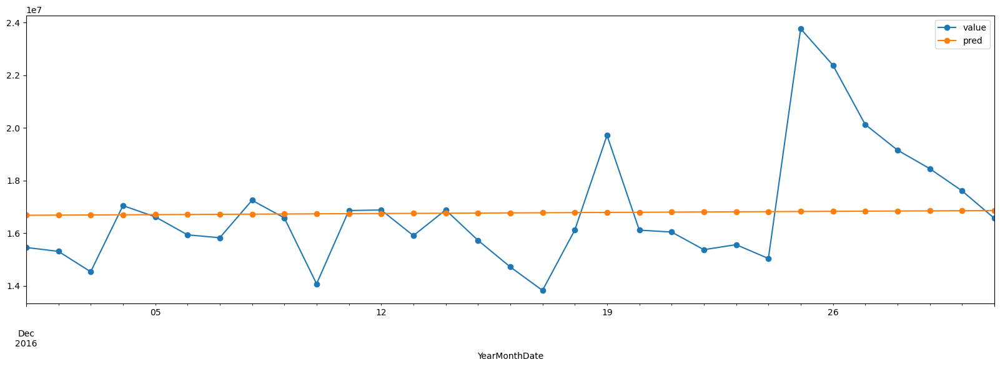

In [715]:
model = sm.tsa.ExponentialSmoothing(train_x.value, trend='add').fit(smoothing_level=0.4)
test_x['pred'] = model.forecast(steps = 31)
test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])

## the error has reduced to 8.7% now.

# 4. Triple Exponential smoothing (aka Holt-Winters Method)

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\akash\AppData\Local\Temp\ipykernel_1760\2797108481.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_x['pred'] = model.forecast(steps=31)


MAE : 1226617.545
RMSE : 1949228.927
MAPE: 0.065


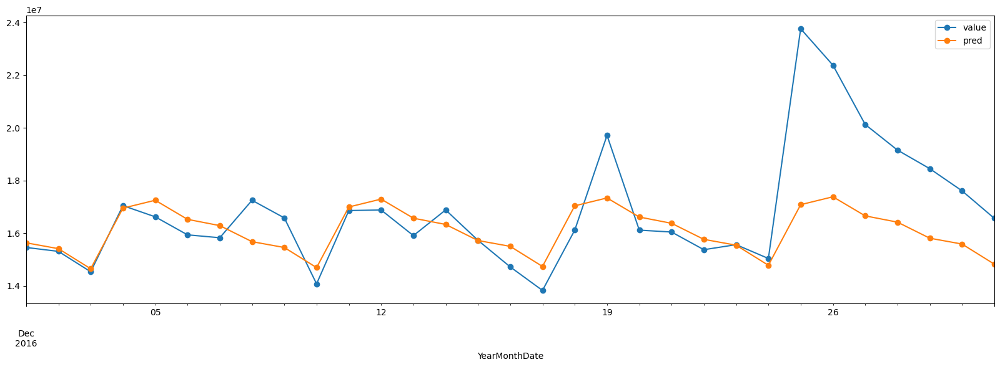

In [716]:
model = sm.tsa.ExponentialSmoothing(train_x.value, trend='add', seasonal='add').fit(smoothing_level=0.6)
test_x['pred'] = model.forecast(steps=31)
test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])

## THE MAPE is 6.5%, the best till now

# STATIONARY

p-value > 0.05: This means that we fail to reject the null hypothesis, and the time series is likely non-stationary.

In [717]:
def adf_test(dataset):
    
    pvalue = sm.tsa.stattools.adfuller(dataset)[1]
    if pvalue <= 0.05:
        print('Sequence is stationary')
    else:
        print('Sequence is not stationary')

adf_test(de.value)       

Sequence is not stationary


## Lets remove trend and seasonality from data

<Axes: xlabel='YearMonthDate'>

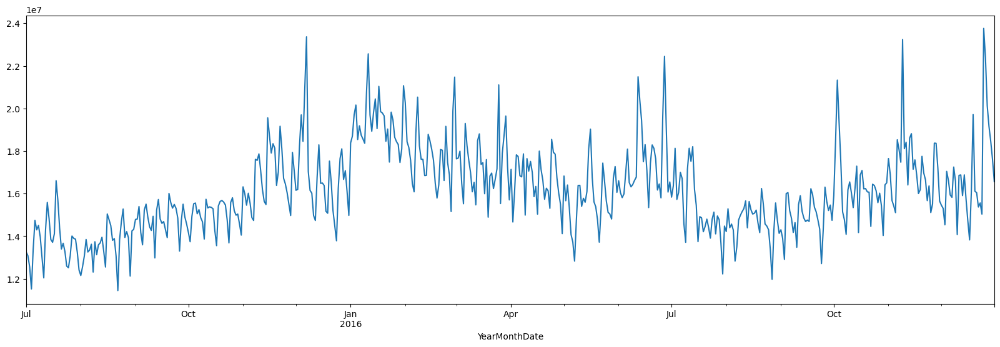

In [248]:
de.value.plot()

<Axes: xlabel='YearMonthDate'>

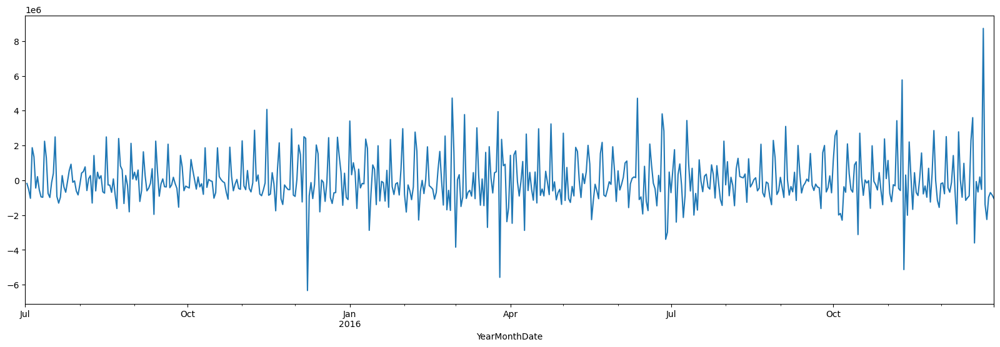

In [249]:
detrend = de.value.diff()
detrend.plot()

In [250]:
adf_test(detrend.dropna())

Sequence is stationary


## De-seasonalising

<Axes: xlabel='YearMonthDate'>

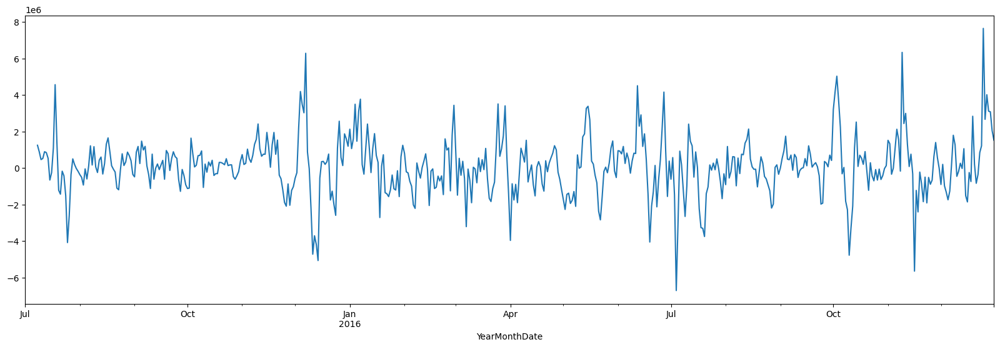

In [253]:
deseas = de.value.diff(7)
deseas.plot()

<Axes: xlabel='YearMonthDate'>

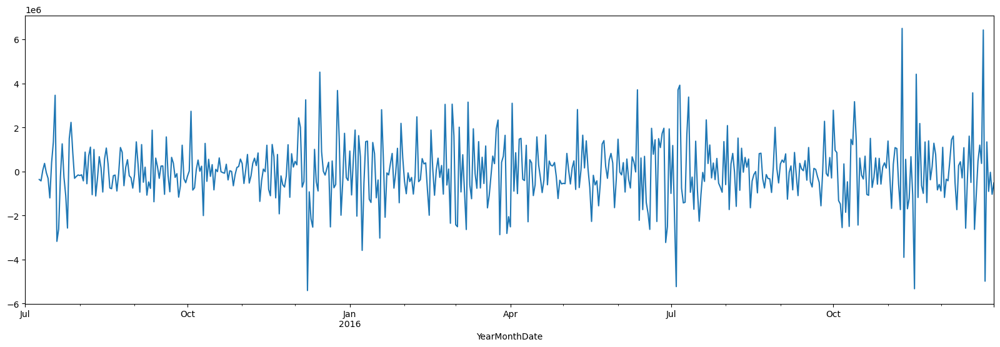

In [254]:
stationary = de.value.diff(1).diff(7)
stationary.plot()

# Plotting ACF and PACF

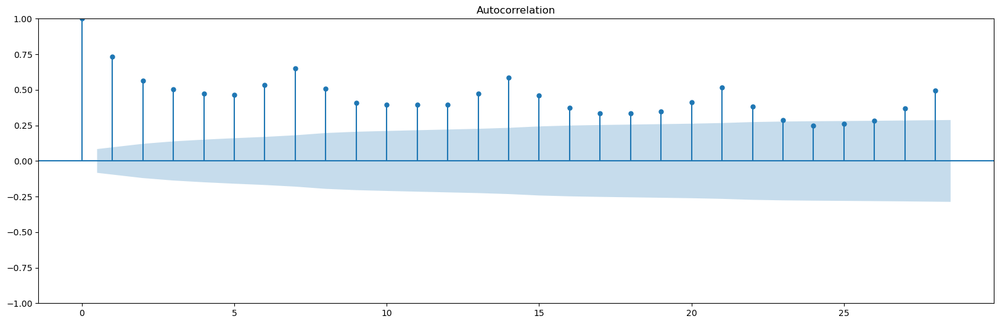

In [255]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(de.value);

From the plot we can see that the correlation value increases at every 7 days which we couldn't recognise just by looking at the actual data plot. So there is also a 7 days seasonality.

It peaks every 7th Day.

### After removing trend from data we can see there is weekly seasonality in data

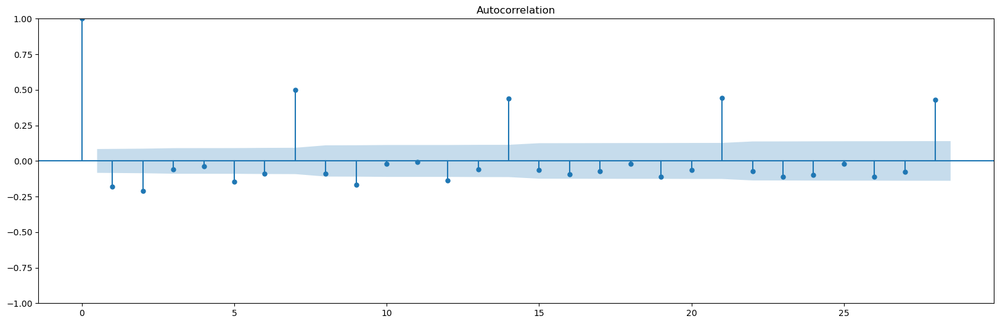

In [256]:
plot_acf(de.value.diff().dropna());

## Lets remove trend and seasonality as well

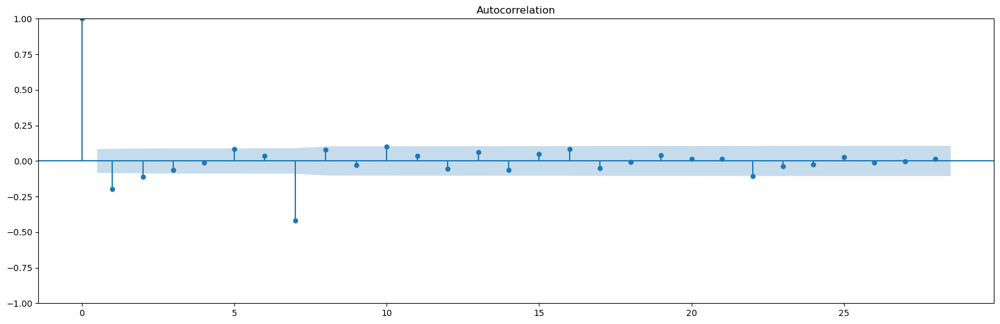

In [257]:
plot_acf(de.value.diff().diff(7).dropna());

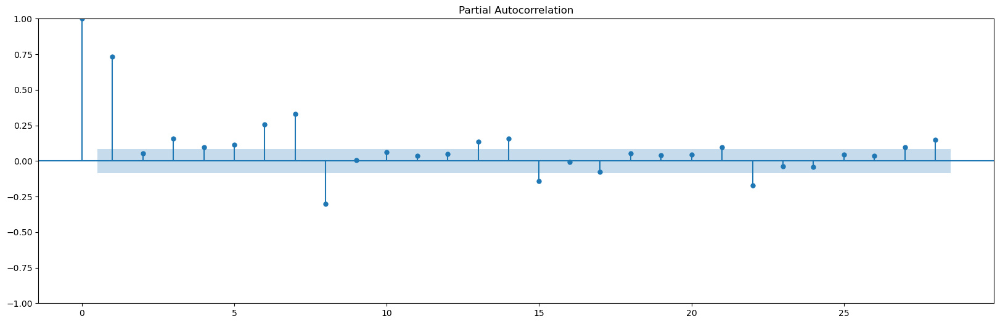

In [258]:
plot_pacf(de.value);

## ACF shows correlation between the lagged values and PACF shows correlation when intermediate effect is removed.

# ARIMA Family of Forecasting Techniques

## 1. AR

In [719]:
def adf_test(dataset):
   pvalue = sm.tsa.stattools.adfuller(dataset)[1]
   if pvalue <= 0.05:
      print('Sequence is stationary')
   else:
      print('Sequence is not stationary')

adf_test(train_x.value)

Sequence is not stationary


In [720]:
#making it stationary
train_x_st = train_x.copy()
train_x_st.value = train_x_st.value.diff(1)
train_x_st.dropna(inplace=True)
adf_test(train_x_st.value)

Sequence is stationary


In [721]:
import statsmodels as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\AppData\Local\Temp\ipykernel_1760\3726725916.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_x['pred'] = model.forecast(steps=31)
C:\Users\akash\AppData\Local\Temp\ipykernel_1760\3726725916.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

MAE : 1533974.001
RMSE : 2388472.122
MAPE: 0.083


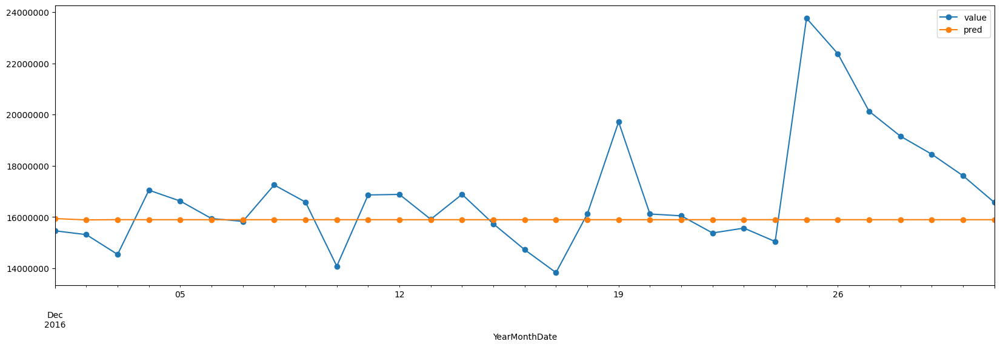

In [722]:
model = SARIMAX(train_x_st.value, order=(1, 0, 0))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31)
test_x['pred'].head(20)

# Integrate !!
test_x['pred'] = test_x['pred'].cumsum() + train_x.value[-1]

test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')

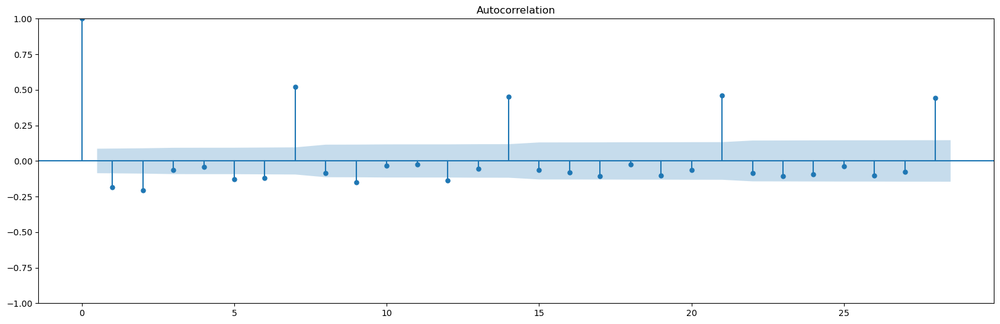

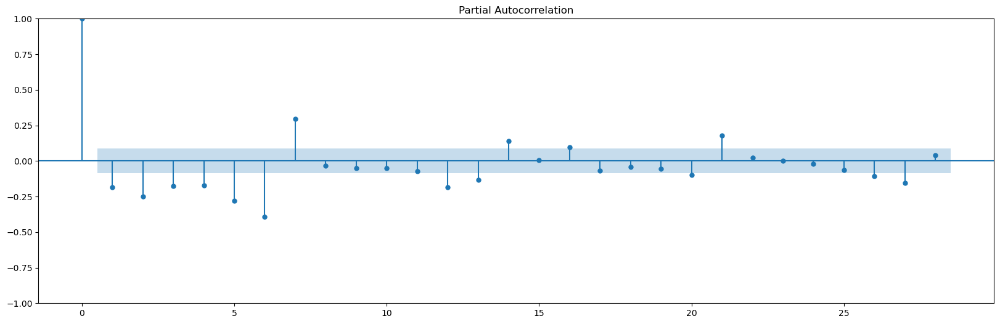

In [723]:
plot_acf(train_x_st.value);
plot_pacf(train_x_st.value);

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\AppData\Local\Temp\ipykernel_1760\2234168631.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_x['pred'] = model.forecast(steps=31)
C:\Users\akash\AppData\Local\Temp\ipykernel_1760\2234168631.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

MAE : 1328237.943
RMSE : 2085152.853
MAPE: 0.071


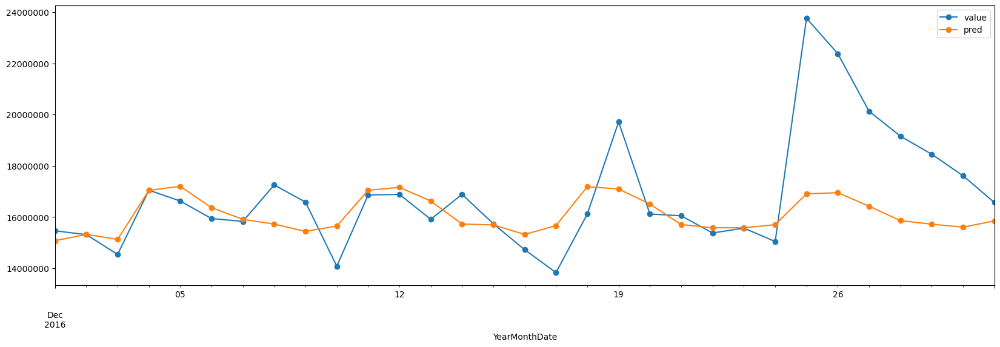

In [724]:
model = SARIMAX(train_x_st.value, order=(21, 0, 0))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31)
test_x['pred'].head(20)

# Integrate !!
test_x['pred'] = test_x['pred'].cumsum() + train_x.value[-1]

test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')

## Error is around 7%

# 2. MA

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


MAE : 1457497.763
RMSE : 2263148.427
MAPE: 0.08


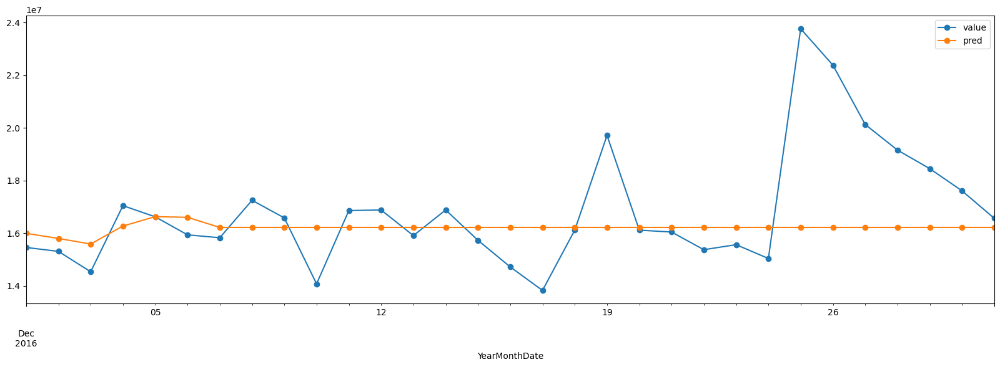

In [321]:
model = SARIMAX(train_x_st.value, order=(0, 0, 7))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31)

test_x['pred'] = test_x['pred'].cumsum() + train_x.value[-1]

test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])

## Error is again 8%

# 3. ARMA

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAE : 1320896.476
RMSE : 1900410.983
MAPE: 0.072


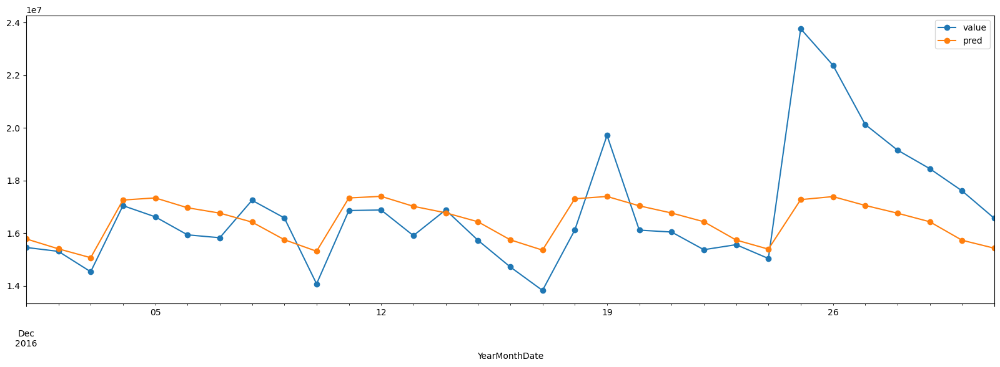

In [322]:
model = SARIMAX(train_x_st.value, order=(7, 0, 7))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31)

test_x['pred'] = test_x['pred'].cumsum() + train_x.value[-1]

test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])

## Error is again around 7%

# 4. ARIMA

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAE : 1255636.783
RMSE : 2066591.175
MAPE: 0.066


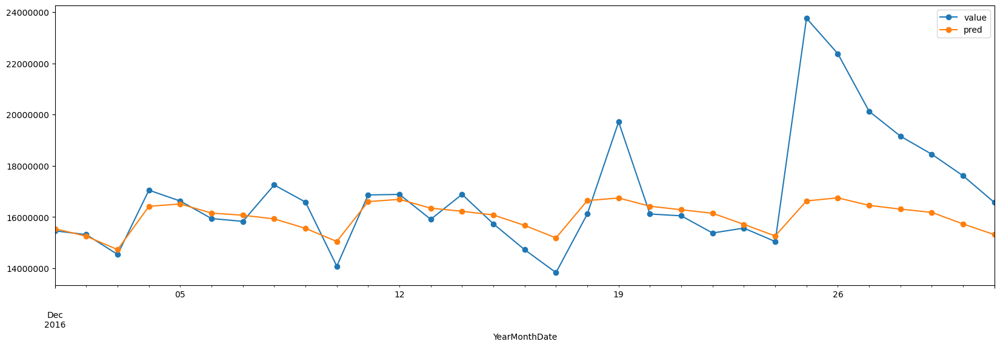

In [328]:
model = SARIMAX(train_x.value, order=(7, 1, 7))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31)

test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAE : 1205355.88
RMSE : 1988160.252
MAPE: 0.064


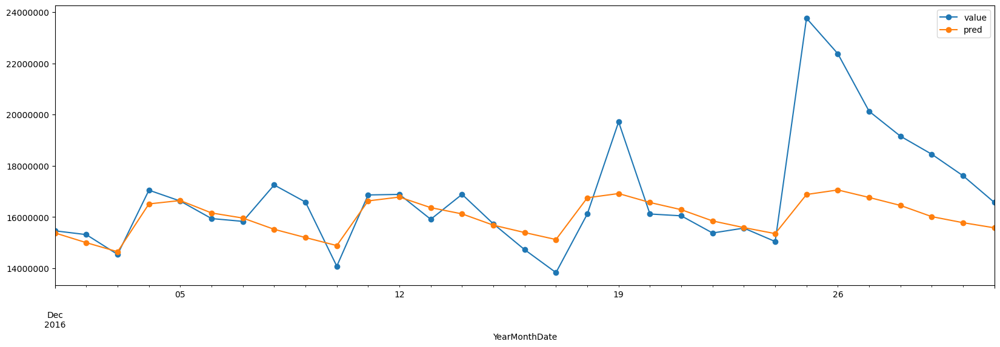

In [331]:
model = SARIMAX(train_x.value, order=(7, 2, 7))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31)

test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')

# 5. SARIMAX

## For de language

In [43]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import itertools
import pandas as pd


def TuneSarimax(train_x):
    
    # Define ranges for p, d, q (non-seasonal) and P, D, Q, s (seasonal)
    p = d = q = range(0, 2)  # Try values from 0 to 2 for p, d, q
    P = D = Q = range(0, 2)  # Seasonal range 0 or 1
    s = [7]  # Example: Weekly seasonality

    # Create all possible combinations of non-seasonal and seasonal parameters
    non_seasonal_params = list(itertools.product(p, d, q))
    seasonal_params = list(itertools.product(P, D, Q, s))


    results = []

    for order in non_seasonal_params:
        for seasonal_order in seasonal_params:
            try:
                model = SARIMAX(train_x, order=order, seasonal_order=seasonal_order)
                model_fit = model.fit(disp=False)
                aic = model_fit.aic
                results.append((order, seasonal_order, aic))
            except:
                continue  # Skip combinations that fail

    # Find the combination with the lowest AIC
    best_result = sorted(results, key=lambda x: x[2])[0]

    print("Best Non-seasonal Order:", best_result[0])
    print("Best Seasonal Order:", best_result[1])
    print("Best AIC:", best_result[2])
    
    return best_result[0],best_result[1]

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\AppData\Local\Temp\ipykernel_18900\3768218153.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_x['pred'] = model.forecast(steps=31)


MAE : 1326763.41
RMSE : 2212767.624
MAPE: 0.069


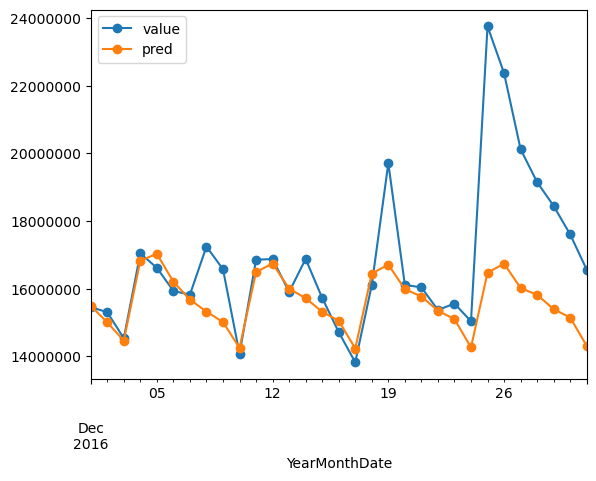

In [34]:
model = SARIMAX(train_x.value, order=(0, 1, 0), seasonal_order=(1,1,1,7))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31)
test_x.plot(style='-o')
plt.ticklabel_format(style='plain', axis='y')
performance(test_x['value'], test_x['pred'])

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


MAE : 1256427.31
RMSE : 1970108.463
MAPE: 0.067


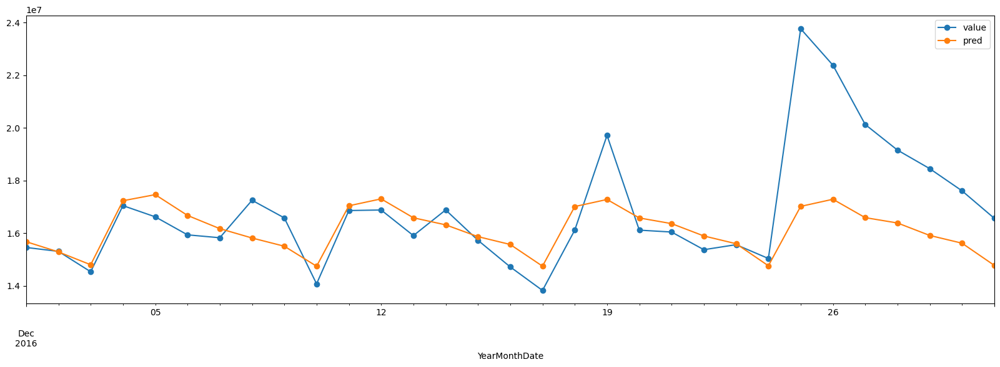

In [371]:
model = SARIMAX(train_x.value, order=(2, 1, 2), seasonal_order=(1,1,1,7))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31)
test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])

## Best Model 

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\AppData\Local\Temp\ipykernel_18900\2849220449.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy o

MAE : 1205355.88
RMSE : 1988160.252
MAPE: 0.064


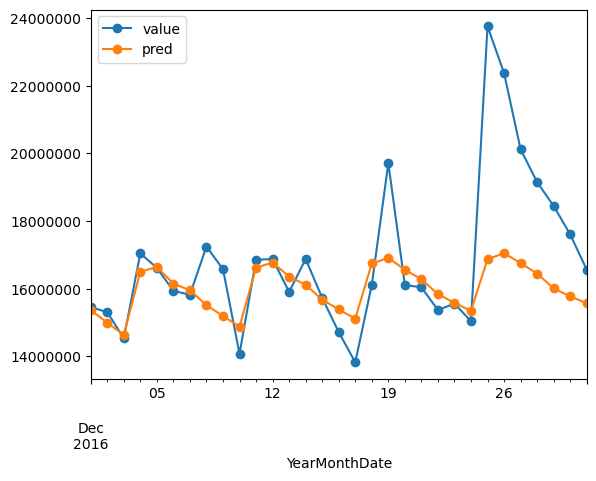

In [36]:
model = SARIMAX(train_x.value, order=(7, 2, 7))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31)

test_x.plot(style='-o')
performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')

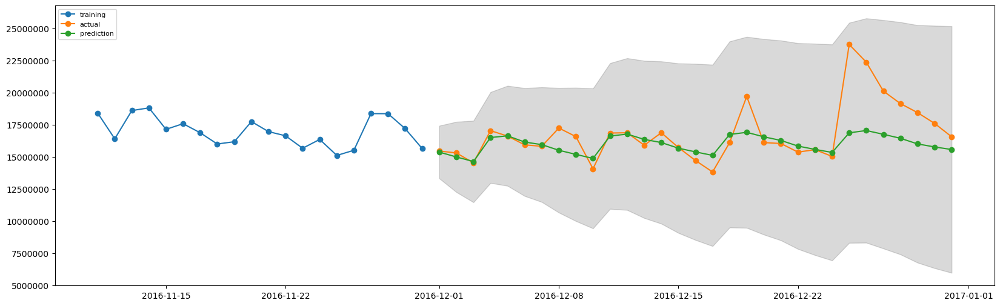

In [374]:
test_x[['lower', 'upper']] = model.get_forecast(steps=31).conf_int(0.05).values
plt.plot(train_x['value'][-20:], '-o', label='training')
plt.plot(test_x['value'], '-o', label='actual')
plt.plot(test_x['pred'], '-o', label='prediction')
plt.fill_between(test_x.index, test_x['lower'], test_x['upper'],
                 color='k', alpha=.15)
plt.legend(loc='upper left', fontsize=8)
plt.ticklabel_format(style='plain', axis='y')
plt.show()

# Creating p,d,q combinations for tuning Sarimax

In [106]:
p_range = range(7)  # p ranges from 0 to 6
q_range = range(7)  # q ranges from 0 to 6
d_values = [1, 2]   # d is 1 or 2

# Generate combinations for (p, d, q)
pdq_combinations = list(itertools.product(p_range, d_values, q_range))

# Generate combinations for (P, D, Q) (seasonal counterparts)
PDQ_combinations = list(itertools.product(p_range, d_values, q_range))

PDQ_combinations = [(x, y, z,7) for x, y, z in PDQ_combinations]

# hyperparameter tuning

In [111]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
# Create empty list to store search results
order_aic_bic=[]

for i,j in zip(pdq_combinations,PDQ_combinations):
        model = SARIMAX(en, order=i,seasonal_order =j,)  #because adf test showed that d=1
        results = model.fit()
        
        # Append order and results tuple
        order_aic_bic.append((i,j,results.aic, results.bic))

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-pa

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: N

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packa

# Finding the best parameters

In [113]:
# Construct DataFrame from order_aic_bic
order_df = pd.DataFrame(order_aic_bic, 
                        columns=['seas','nseas','AIC','BIC'])

# Print order_df in order of increasing AIC
order_df.sort_values('AIC')

,seas,nseas,AIC,BIC
59,"(4, 1, 3)","(4, 1, 3, 7)",18756.39,18820.81
73,"(5, 1, 3)","(5, 1, 3, 7)",18756.41,18829.43
45,"(3, 1, 3)","(3, 1, 3, 7)",18758.46,18814.30
87,"(6, 1, 3)","(6, 1, 3, 7)",18761.51,18843.12
31,"(2, 1, 3)","(2, 1, 3, 7)",18796.63,18843.88
...,...,...,...,...
13,"(0, 2, 6)","(0, 2, 6, 7)",19182.42,19238.06
10,"(0, 2, 3)","(0, 2, 3, 7)",19182.67,19212.63
35,"(2, 2, 0)","(2, 2, 0, 7)",19202.50,19223.91
21,"(1, 2, 0)","(1, 2, 0, 7)",19355.47,19368.31


In [114]:
# Print order_df in order of increasing BIC
order_df.sort_values('BIC')

,seas,nseas,AIC,BIC
45,"(3, 1, 3)","(3, 1, 3, 7)",18758.46,18814.30
1,"(0, 1, 1)","(0, 1, 1, 7)",18801.91,18814.79
59,"(4, 1, 3)","(4, 1, 3, 7)",18756.39,18820.81
15,"(1, 1, 1)","(1, 1, 1, 7)",18802.07,18823.55
2,"(0, 1, 2)","(0, 1, 2, 7)",18806.18,18827.66
...,...,...,...,...
12,"(0, 2, 5)","(0, 2, 5, 7)",19165.70,19212.78
35,"(2, 2, 0)","(2, 2, 0, 7)",19202.50,19223.91
13,"(0, 2, 6)","(0, 2, 6, 7)",19182.42,19238.06
21,"(1, 2, 0)","(1, 2, 0, 7)",19355.47,19368.31


In [155]:
order_df.sort_values('AIC').iloc[0]["nseas"]

(4, 1, 3, 7)

In [138]:
train_max_date = EN.index[-31]
train_x = EN.loc[EN.index < EN.index[-31]].copy()
test_x = EN.loc[EN.index >= EN.index[-31]].copy()

# Building Model based on best parameter

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Lik

MAE : 16223073.933
RMSE : 19344227.855
MAPE: 0.128


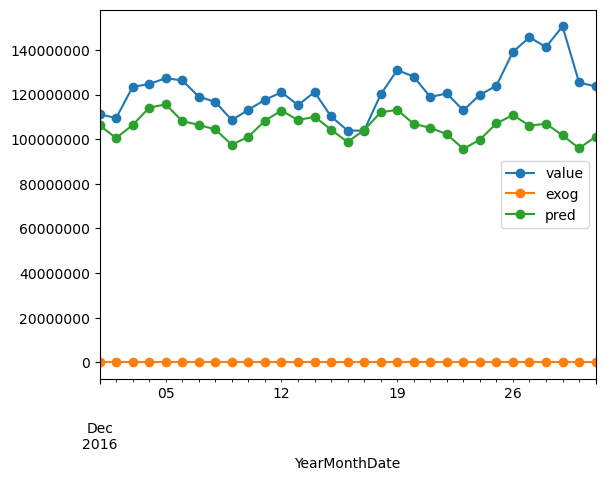

In [145]:
model = SARIMAX(train_x.value, order=(3, 1, 3),seasonal_order = (3, 1, 3, 7))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31)

test_x[["pred","value"]].plot(style='-o')
performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')
plt.show()

## 12.8% MAPE which is bad

# Lets add exog variable here

In [ ]:
EN["exog"] = binary_list
EN.drop("Language",inplace=True,axis=1)
EN.index = EN["YearMonthDate"]
EN.drop("YearMonthDate",inplace=True,axis=1)
EN.index = pd.to_datetime(EN.index)

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Lik

MAE : 5001277.681
RMSE : 6067744.502
MAPE: 0.041


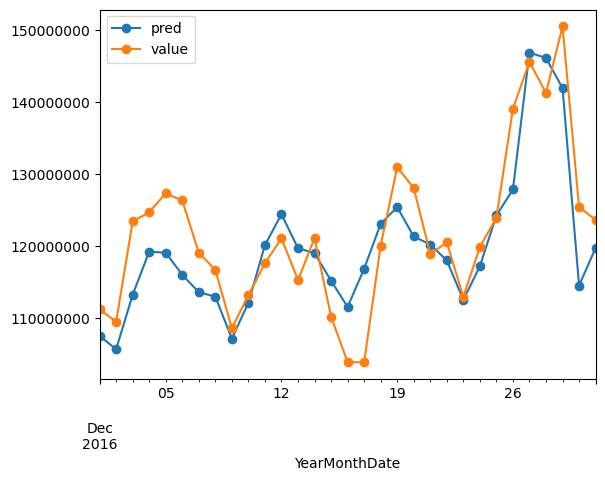

In [143]:
model = SARIMAX(train_x.value,exog = train_x["exog"], order=(3, 1, 3),seasonal_order = (3, 1, 3, 7))
model = model.fit(disp=False)
test_x['pred'] = model.forecast(steps=31,exog = test_x["exog"])

test_x[["pred","value"]].plot(style='-o')
performance(test_x['value'], test_x['pred'])
plt.ticklabel_format(style='plain', axis='y')
plt.show()

# Error dropped to 4%, extremely good

# Lets try for rest of the series

In [164]:
from collections import defaultdict
LangTime = {"es":es,"fr":fr,"ja":ja,"ru":ru,"zh":zh}

In [161]:
LangTime = {"es":es}

Series forecast for : es


C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self.

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No freque

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible 

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D w

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimizatio

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimizatio

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D w

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so in

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAE : 2784232.61
RMSE : 3075999.416
MAPE: 0.192


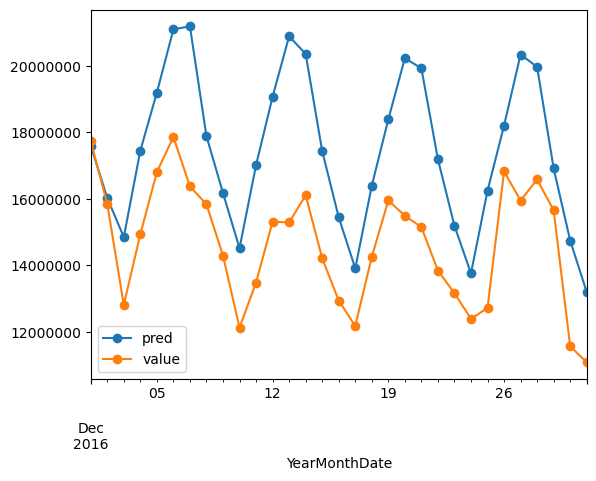

Series forecast for : fr


C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self.

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting 

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D w

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Lik

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D w

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimizatio

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so in

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self.

MAE : 966243.718
RMSE : 1321771.031
MAPE: 0.071


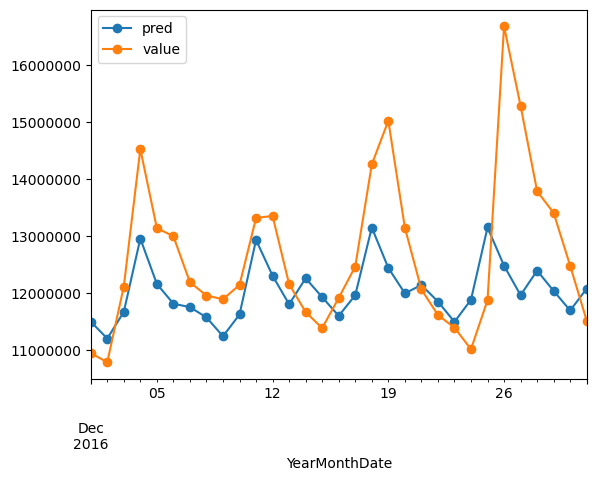

Series forecast for : ja


C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self.

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self.

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self.

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D w

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimizatio

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasona

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D w

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D w

MAE : 1767300.528
RMSE : 2597134.709
MAPE: 0.098


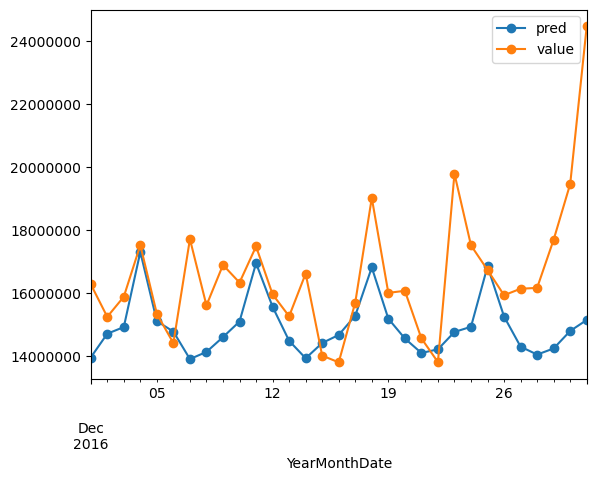

Series forecast for : ru


C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self.

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No freque

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so in

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D w

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D w

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimizatio

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Lik

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn(

MAE : 2051272.241
RMSE : 2363052.511
MAPE: 0.147


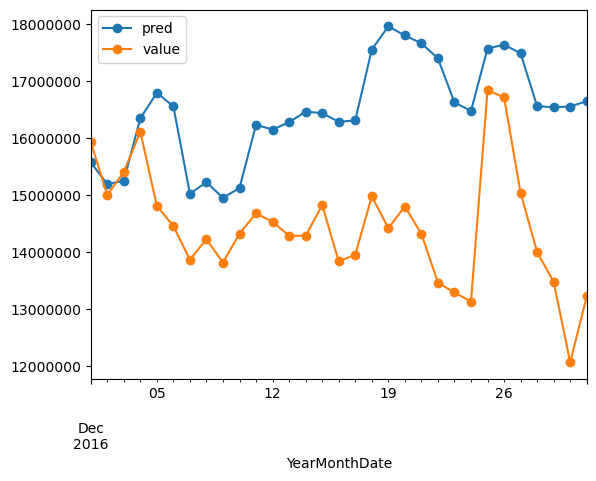

Series forecast for : zh


C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self.

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self.

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting 

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferr

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D w

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so in

C:\Users\akash\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAE : 321825.812
RMSE : 382874.831
MAPE: 0.052


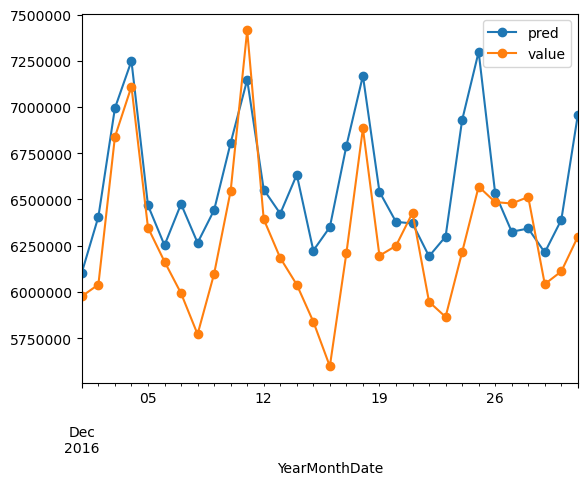

In [166]:
for k in LangTime:
    print("Series forecast for :",k)
    order_aic_bic=[]
    
    train_max_date = LangTime[k].index[-31]
    train_x = LangTime[k].loc[LangTime[k].index < LangTime[k].index[-31]].copy()
    test_x = LangTime[k].loc[LangTime[k].index >= LangTime[k].index[-31]].copy()

    for i,j in zip(pdq_combinations,PDQ_combinations):
            model = SARIMAX(train_x, order=i,seasonal_order =j,)  #because adf test showed that d=1
            results = model.fit()

            # Append order and results tuple
            order_aic_bic.append((i,j,results.aic, results.bic))
            
    order_df = pd.DataFrame(order_aic_bic, 
                        columns=['seas','nseas','AIC','BIC'])

    # Print order_df in order of increasing AIC
    nseas = order_df.sort_values('AIC').iloc[0]["nseas"]
    seas = order_df.sort_values('AIC').iloc[0]["seas"]
    
    
    model = SARIMAX(train_x.value, order=seas,seasonal_order = nseas)
    model = model.fit(disp=False)
    test_x['pred'] = model.forecast(steps=31)

    test_x[["pred","value"]].plot(style='-o')
    performance(test_x['value'], test_x['pred'])
    plt.ticklabel_format(style='plain', axis='y')
    plt.show()
    print("="*50)

# Time series with linear regression

In [404]:
# Create the 'date' column
de['date'] = de.index

# Create the 'weekday' column
de['weekday'] = de.index.strftime('%A')  # Full weekday name

# Assume no holidays (False), or integrate a holiday calendar if available
de['holiday'] = False  # Set as False for now
de['holiday'] = de['holiday'].astype(int)

# The 'total' column is the same as the 'Value' column
de['value'] = de['value']

# Create the 'weekend' column (1 for Saturday/Sunday, 0 for others)
de['weekend'] = de.index.weekday >= 5  # 5 = Saturday, 6 = Sunday
de['weekend'] = de['weekend'].astype(int)

# Create the 'working_day' column (1 for weekdays, 0 for weekends)
de['working_day'] = de.index.weekday < 5  # 0-4 = Monday-Friday
de['working_day'] = de['working_day'].astype(int)

In [408]:
de = de.reset_index()

## Lets see how de looks like

In [417]:
de

,YearMonthDate,value,date,weekday,holiday,weekend,working_day,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Lag_7,last_wek_avg_level
7,2015-07-08,14505194.00,2015-07-08,Wednesday,0,0,1,14296292.00,14741758.00,13392347.00,11520379.00,12554042.00,13079896.00,13260519.00,13263604.71
8,2015-07-09,13964778.00,2015-07-09,Thursday,0,0,1,14505194.00,14296292.00,14741758.00,13392347.00,11520379.00,12554042.00,13079896.00,13441415.43
9,2015-07-10,13014478.00,2015-07-10,Friday,0,0,1,13964778.00,14505194.00,14296292.00,14741758.00,13392347.00,11520379.00,12554042.00,13567827.14
10,2015-07-11,12039840.00,2015-07-11,Saturday,0,1,0,13014478.00,13964778.00,14505194.00,14296292.00,14741758.00,13392347.00,11520379.00,13633603.71
11,2015-07-12,14283405.00,2015-07-12,Sunday,0,1,0,12039840.00,13014478.00,13964778.00,14505194.00,14296292.00,14741758.00,13392347.00,13707812.43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545,2016-12-27,20125264.00,2016-12-27,Tuesday,0,0,1,22376548.00,23760349.00,15037095.00,15561414.00,15370604.00,16041249.00,16112933.00,17751456.00
546,2016-12-28,19152389.00,2016-12-28,Wednesday,0,0,1,20125264.00,22376548.00,23760349.00,15037095.00,15561414.00,15370604.00,16041249.00,18324646.14
547,2016-12-29,18447906.00,2016-12-29,Thursday,0,0,1,19152389.00,20125264.00,22376548.00,23760349.00,15037095.00,15561414.00,15370604.00,18769094.71
548,2016-12-30,17606030.00,2016-12-30,Friday,0,0,1,18447906.00,19152389.00,20125264.00,22376548.00,23760349.00,15037095.00,15561414.00,19208709.29


In [412]:
for i in range(1,8):
    de["Lag_{}".format(i)] = de['value'].shift(i)
    
lis = ['Lag_{}'.format(i) for i in range(1,8)]
de.dropna(inplace = True)    # Drop because some Lags will be NaN.
de['last_wek_avg_level'] = de.loc[:,lis].sum(axis=1)/7

de['dayofweek'] = de['date'].dt.dayofweek
de['view_wrt_dow'] = de.groupby('dayofweek')['value'].transform('mean')
de[['view_wrt_dow', 'dayofweek']].drop_duplicates()

In [421]:
dfde = de.copy()

In [424]:
df = dfde[['value', 'Lag_1', 'last_wek_avg_level','view_wrt_dow', 'holiday']]
df.head()

,value,Lag_1,last_wek_avg_level,view_wrt_dow,holiday
7,14505194.00,14296292.00,13263604.71,16148331.01,0
8,13964778.00,14505194.00,13441415.43,15814681.87,0
9,13014478.00,13964778.00,13567827.14,15602628.05,0
10,12039840.00,13014478.00,13633603.71,14793005.49,0
11,14283405.00,12039840.00,13707812.43,17016593.96,0


In [428]:
train = df.iloc[:df.shape[0]-31].dropna()
test = df.iloc[df.shape[0]-31:]


train_X = train.drop(["value"],axis =1)
train_y = train['value']
test_X = test.drop(["value"],axis =1)
test_y = test['value']

In [431]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_percentage_error as mape

# Train and pred
model = LinearRegression()
model.fit(train_X, train_y)
y_pred = pd.Series(model.predict(test_X), index=test.index)
mape(test['value'],y_pred)

0.0495247064413066

# fb Prophet

In [484]:
fb = dfde[["YearMonthDate","value","holiday"]]

In [486]:
fb['ds'] = pd.to_datetime(fb['YearMonthDate'])
fb['y'] = fb['value']
fb = fb[['ds', 'y', 'holiday']]
fb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 543 entries, 7 to 549
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   ds       543 non-null    datetime64[ns]
 1   y        543 non-null    float64       
 2   holiday  543 non-null    int32         
dtypes: datetime64[ns](1), float64(1), int32(1)
memory usage: 14.8 KB


C:\Users\akash\AppData\Local\Temp\ipykernel_1760\294615952.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fb['ds'] = pd.to_datetime(fb['YearMonthDate'])
C:\Users\akash\AppData\Local\Temp\ipykernel_1760\294615952.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fb['y'] = fb['value']


In [487]:
fb

,ds,y,holiday
7,2015-07-08,14505194.00,0
8,2015-07-09,13964778.00,0
9,2015-07-10,13014478.00,0
10,2015-07-11,12039840.00,0
11,2015-07-12,14283405.00,0
...,...,...,...
545,2016-12-27,20125264.00,0
546,2016-12-28,19152389.00,0
547,2016-12-29,18447906.00,0
548,2016-12-30,17606030.00,0


16:51:09 - cmdstanpy - INFO - Chain [1] start processing
16:51:09 - cmdstanpy - INFO - Chain [1] done processing


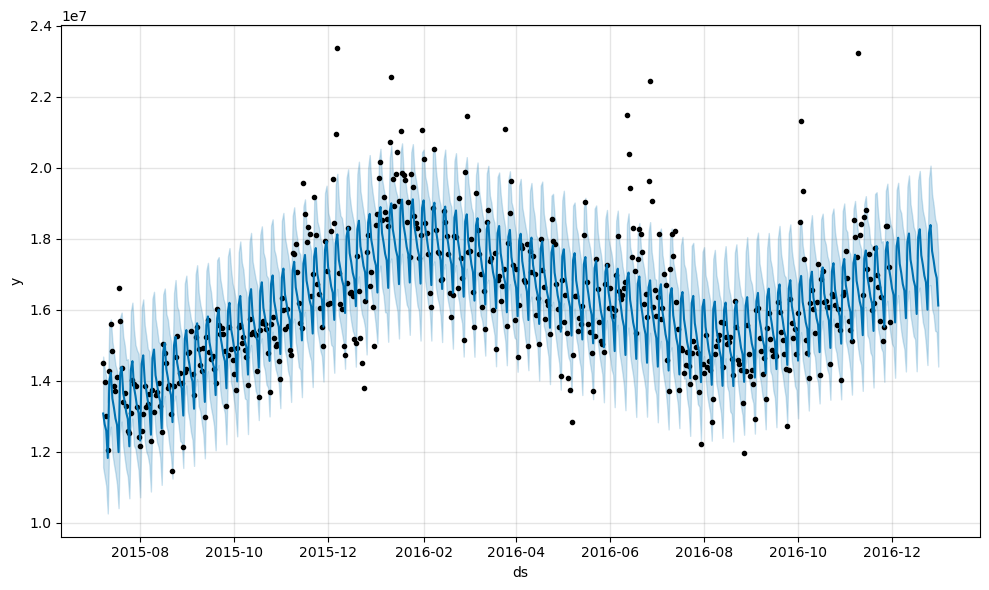

In [507]:
from prophet import Prophet
m = Prophet()
m.fit(fb[['ds', 'y']][:-31]) #here we are leaving last 39 observations because we will predict it in 'future'
future = m.make_future_dataframe(periods=31,freq="D")
forecast = m.predict(future)
fig = m.plot(forecast)

In [510]:
performance(fb['y'][:-31],forecast['yhat'][:-31])

MAE : 891198.861
RMSE : 1231866.113
MAPE: 0.054


### Model 2

16:55:00 - cmdstanpy - INFO - Chain [1] start processing
16:55:00 - cmdstanpy - INFO - Chain [1] done processing


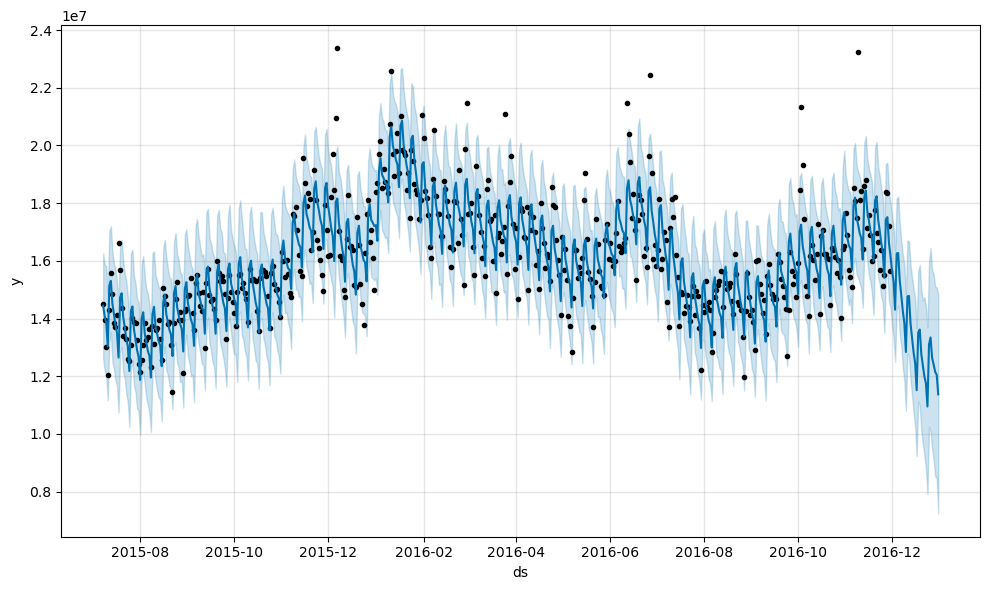

In [513]:
    model2=Prophet(interval_width=0.95, yearly_seasonality=True, weekly_seasonality=True,
               changepoint_prior_scale=4)
model2.add_regressor('holiday') #adding holidays data in the model3
model2.fit(fb[:-31])
forecast2 = model2.predict(fb)
fig = model2.plot(forecast2)

In [515]:
performance(fb['y'][:-31],forecast2['yhat'][:-31])

MAE : 683064.734
RMSE : 968643.659
MAPE: 0.042


# Conclusion

 Summary of MAPE values for different methods and models**

| **Method/Model**                                            | **MAPE (%)** |
| ----------------------------------------------------------- | ------------ |
| Forecasting Mean                                            | 8.2          |
| Naive Approach                                              | 8.7          |
| Seasonal Naïve                                              | 12.6         |
| Drift Method                                                | 8.5          |
| Moving Average Forecasting                                  | 12.4         |
| Simple Exponential Smoothing                                | 9.0          |
| Adding Trend to Exponential Smoothing                       | 8.7          |
| Triple Exponential Smoothing                                | 6.5          |
| AR                                                          | 7.0          |
| MA                                                          | 8.0          |
| ARMA                                                        | 7.0          |
| ARIMA                                                       | 6.0          |
| SARIMAX                                                     | 6.0          |
| English Language with Hyperparameter Tuning                 | 12.0         |
| English Language with Tuning and Exogenous Variable         | 4.0          |
| Time Series with Linear Regression (`de` language)          | 4.0          |
| FB Prophet (`de` language)                                  | 5.0          |
| FB Prophet with Seasonalities and Regressor (`de` language) | 4.0          |

**MAPE for SARIMAX with Hyperparameter Tuning (other languages):**

| **Language** | **MAPE (%)** |
| ------------ | ------------ |
| `es`         | 19.0         |
| `fr`         | 7.0          |
| `ja`         | 9.0          |
| `ru`         | 14.0         |
| `zh`         | 5.0          |


# Business Recommendation

Focus Ad Investments on High-View Languages

    Prioritize advertising strategies for languages with the highest view counts, particularly English (en), which accounts for the largest audience, followed by Spanish (es) and German (de).


Leverage Regional and Language-Specific Insights

    Tailor ad campaigns to capitalize on regional view variations by optimizing content for specific cultures and languages, improving ad relevance and engagement.


Adopt SARIMAX Models for Better Accuracy

    Use SARIMAX models with hyperparameter tuning for accurate predictions, especially for languages like fr, ja, and zh, where the MAPE is below 10%, ensuring higher ROI for localized ad campaigns.


Capitalize on Time Series Models with Exogenous Variables

    Deploy models like SARIMAX with exogenous variables (e.g., external events or holidays) for English pages, which achieved the lowest MAPE (4.0%), boosting forecast accuracy and strategic decision-making.


Implement FB Prophet for Specific Use Cases

    Utilize FB Prophet models for de language, especially with seasonal and holiday regressors, which also achieved a MAPE of 4.0%, offering a robust forecasting option for time-sensitive campaigns.


Develop a Multi-Layered Forecasting Strategy

    Use ARIMA and SARIMAX for large-scale forecasting, and employ simpler methods like Exponential Smoothing for quick insights when precision is less critical.


Focus on Emerging Audiences

    Explore opportunities to grow ad presence in languages with moderate views, such as ru, fr, and ja, where there is potential for significant audience engagement improvement.


Allocate Resources for Highly Seasonal Pages

    Pages with strong seasonal patterns can drive specific time-bound campaigns. Use decomposition analysis to identify these pages and align ad spending with peak periods.


Refine Forecast Models for High-MAPE Languages

    Invest in refining prediction methods for languages with higher errors, like Spanish (es), which shows a MAPE of 19%. Incorporate additional data features to improve accuracy.


Enhance Scalability Through Automated Methods

    Use Auto ARIMA or other automated parameter optimization methods to handle the scalability challenge effectively for 145,000 pages, reducing manual intervention while maintaining accuracy.
